In [230]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import os
import time
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
%matplotlib inline

from PIL import Image
from tqdm import tqdm
import cv2
from skimage.feature import hog, canny
from skimage.filters import sobel
from skimage import color
from numpy import expand_dims

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Dense, Activation,Dropout,Conv2D, MaxPooling2D,BatchNormalization, Flatten
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras import regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model, load_model, Sequential

In [231]:
sdir=r'C:/PythonProjects/Ship classification/train/images'
csvpath=r'C:/PythonProjects/Ship classification/train//train.csv'
testpath = r'C:/PythonProjects/Ship classification/test_ApKoW4T.csv'

In [232]:
train_df=pd.read_csv(csvpath)  
test_df = pd.read_csv(testpath)
train_df.head()

,image,category
0,2823080.jpg,1
1,2870024.jpg,1
2,2662125.jpg,2
3,2900420.jpg,3
4,2804883.jpg,2


In [233]:
print('Train samples: ', len(train_df))
print('Test samples: ', len(test_df))

Train samples:  6252
Test samples:  2680


(140, 210, 3)


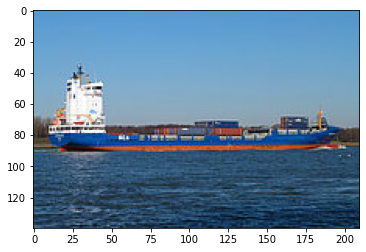

In [234]:
img_path=r'C:/PythonProjects/Ship classification/train/images/2823080.jpg'
img=plt.imread(img_path)
print (img.shape)
plt.imshow(img)

In [235]:
def show_distribution(df):
    {'Cargo': 1, 'Military': 2, 'Carrier': 3, 'Cruise': 4, 'Tankers': 5}

    wedge = [df['category'].value_counts()[1],df['category'].value_counts()[2],
             df['category'].value_counts()[3],df['category'].value_counts()[4],
             df['category'].value_counts()[5]]

    perc = [df['category'].value_counts()[1]/len(df),
            df['category'].value_counts()[2]/len(df),
            df['category'].value_counts()[3]/len(df),
            df['category'].value_counts()[4]/len(df),
            df['category'].value_counts()[5]/len(df),]
    plt.pie(wedge,labels=['Cargo - '+ format(perc[0]*100, '.2f') + '%','Military - '+ format(perc[1]*100, '.2f') + '%','Carrier - '+ format(perc[2]*100, '.2f') + '%','Cruise - '+ format(perc[3]*100, '.2f') + '%','Tankers - '+ format(perc[4]*100, '.2f') + '%'],
        shadow=True,radius = 2.0, textprops={'color':"w"})

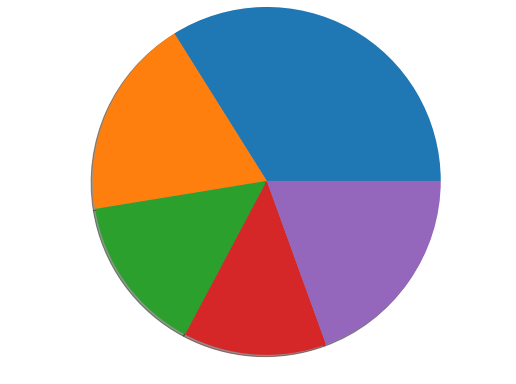

In [236]:
show_distribution(train_df)

In [237]:
train_df['path'] = sdir + '\\' + train_df['image']
test_df['path'] = sdir + '\\' + test_df['image']
train_df.head()

,image,category,path
0,2823080.jpg,1,C:/PythonProjects/Ship classification/train/im...
1,2870024.jpg,1,C:/PythonProjects/Ship classification/train/im...
2,2662125.jpg,2,C:/PythonProjects/Ship classification/train/im...
3,2900420.jpg,3,C:/PythonProjects/Ship classification/train/im...
4,2804883.jpg,2,C:/PythonProjects/Ship classification/train/im...


In [238]:
def is_grey_scale(givenImage):
    w,h = givenImage.size
    for i in range(w):
        for j in range(h):
            r,g,b = givenImage.getpixel((i,j))
            if r != g != b: return False
    return True

In [239]:
def check_color_scale(df):
    sampleFrac = 0.4
    #get our sampled images
    isGreyList = []
    for imageName in df['path'].sample(frac=sampleFrac):
        val = Image.open(imageName).convert('RGB')
        isGreyList.append(is_grey_scale(val))
    print(np.sum(isGreyList) / len(isGreyList))
    del isGreyList

In [240]:
check_color_scale(train_df)

0.024790083966413436


In [241]:
check_color_scale(test_df)

0.02332089552238806


In [242]:
def get_rgb_men(row):
    img = cv2.imread(row['path'])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return np.sum(img[:,:,0]), np.sum(img[:,:,1]), np.sum(img[:,:,2])

tqdm.pandas()
train_df['R'], train_df['G'], train_df['B'] = zip(*train_df.progress_apply(lambda row: get_rgb_men(row), axis=1))

100%|██████████| 6252/6252 [00:05<00:00, 1153.80it/s]


In [243]:
def show_color_dist(df, count):
    fig, axr = plt.subplots(count,2,figsize=(15,15))
    if df.empty:
        print("Image internsity of selected color is weak")
        return
    for idx, i in enumerate(np.random.choice(df['path'], count)):
        img = cv2.imread(i)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axr[idx,0].imshow(img)
        axr[idx,0].axis('off')
        axr[idx,1].set_title('R={:.0f}, G={:.0f}, B={:.0f} '.format(np.mean(img[:,:,0]), np.mean(img[:,:,1]), np.mean(img[:,:,2]))) 
        x, y = np.histogram(img[:,:,0], bins=255)
        axr[idx,1].bar(y[:-1], x, label='R', alpha=0.8, color='red')
        x, y = np.histogram(img[:,:,1], bins=255)
        axr[idx,1].bar(y[:-1], x, label='G', alpha=0.8, color='green')
        x, y = np.histogram(img[:,:,2], bins=255)
        axr[idx,1].bar(y[:-1], x, label='B', alpha=0.8, color='blue')
        axr[idx,1].legend()
        axr[idx,1].axis('off')

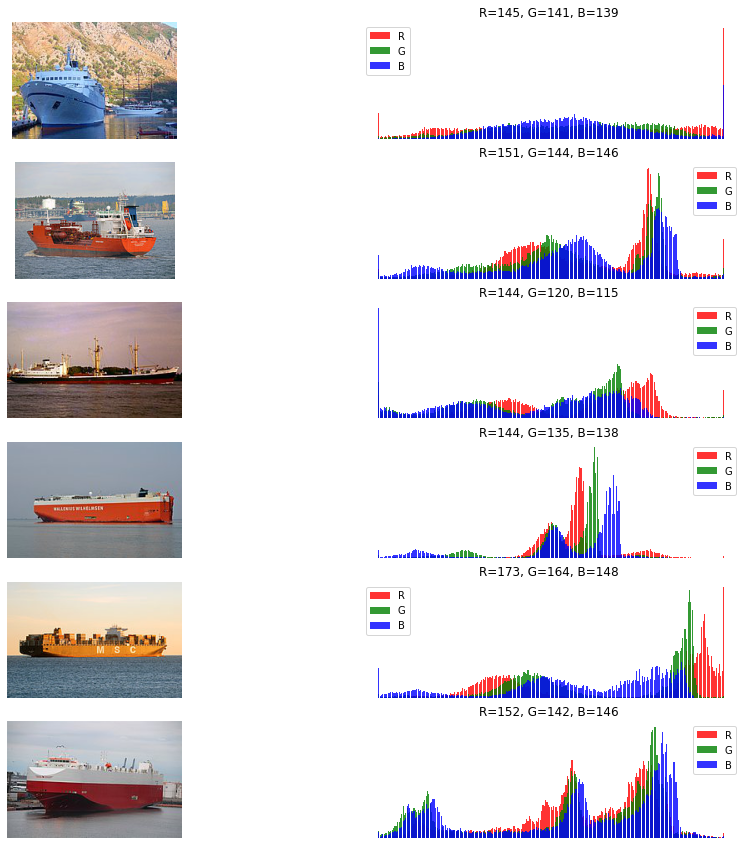

In [244]:
df = train_df[((train_df['B']) < train_df['R']) & ((train_df['G']) < train_df['R'])]
show_color_dist(df, 6)

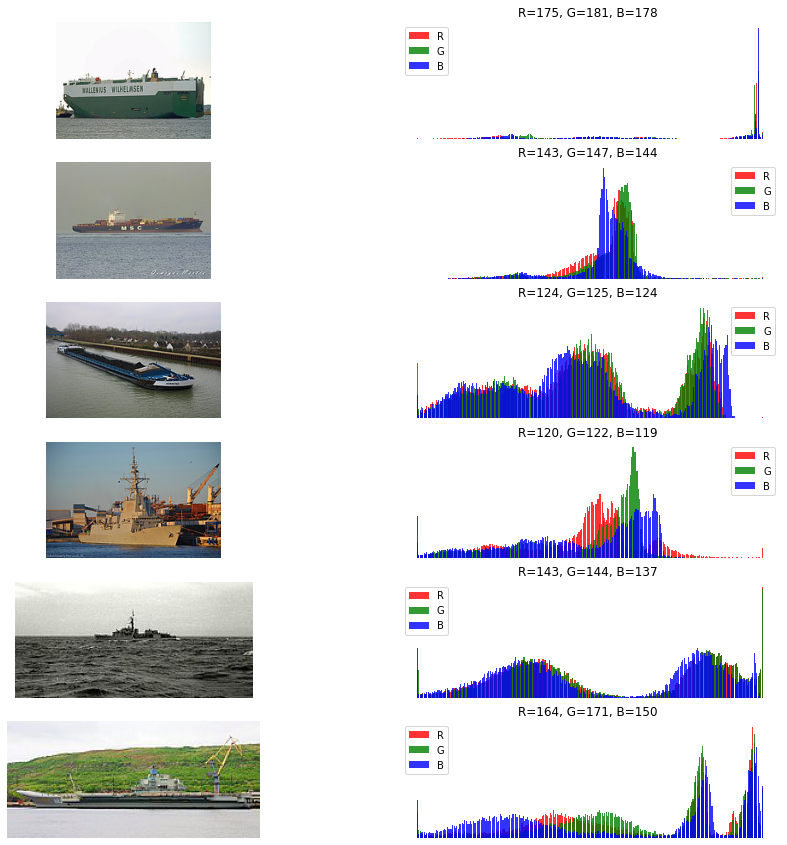

In [245]:
df = train_df[(train_df['G'] > train_df['R']) & (train_df['G'] > train_df['B'])]
show_color_dist(df, 6)

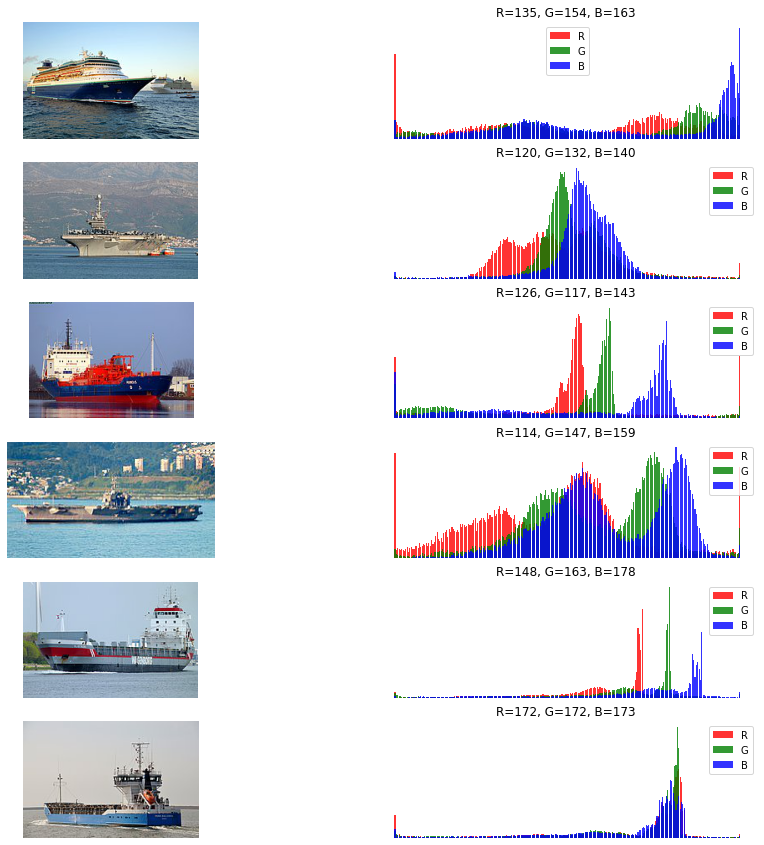

In [246]:
df = train_df[(train_df['B'] > train_df['R']) & (train_df['B'] > train_df['G'])]
show_color_dist(df, 6)

In [247]:
def edges_images_gray(category_type):
    category_df = train_df[train_df['category'] ==  category_type].reset_index(drop = True)
    for idx,i in enumerate(np.random.choice(category_df['path'],4)):
        image = cv2.imread(i)
        gray=cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        edges = sobel(image)
        gray_edges=canny(gray)
        dimension = edges.shape
        fig = plt.figure(figsize=(8, 8))
        plt.suptitle(category_type)
        plt.subplot(2,2,1)
        plt.imshow(gray_edges)
        plt.subplot(2,2,2)
        plt.imshow(edges[:dimension[0],:dimension[1],0], cmap="gray")
        plt.subplot(2,2,3)
        plt.imshow(edges[:dimension[0],:dimension[1],1], cmap='gray')
        plt.subplot(2,2,4)
        plt.imshow(edges[:dimension[0],:dimension[1],2], cmap='gray')
        plt.show()

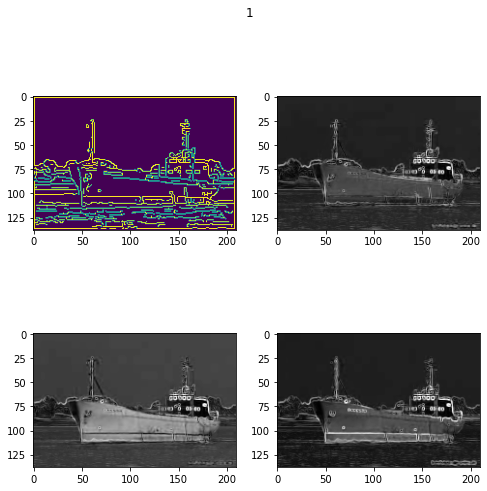

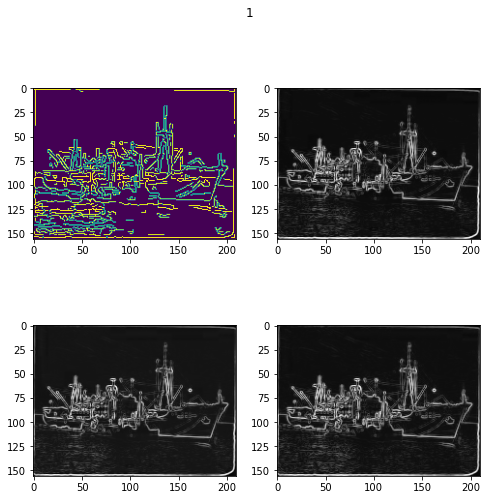

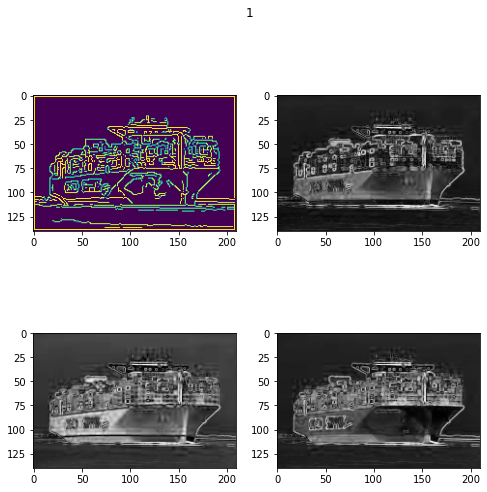

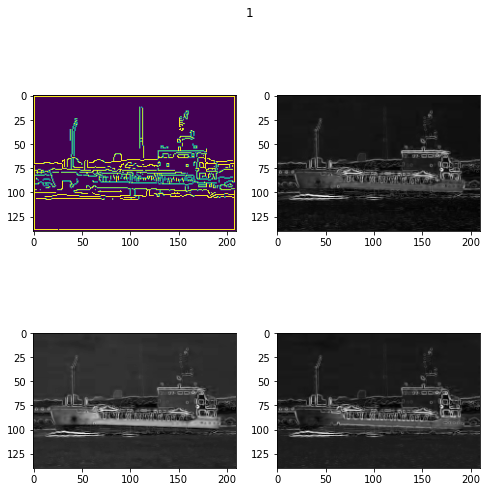

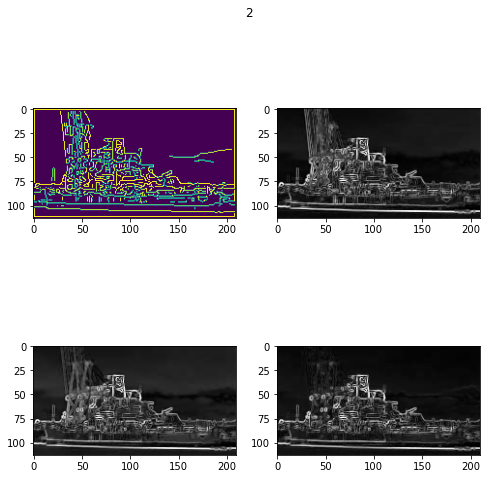

...

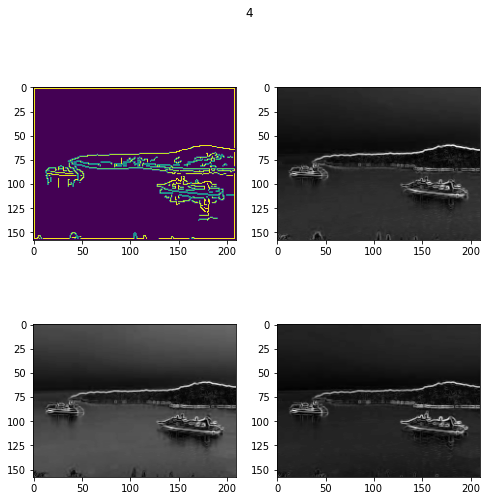

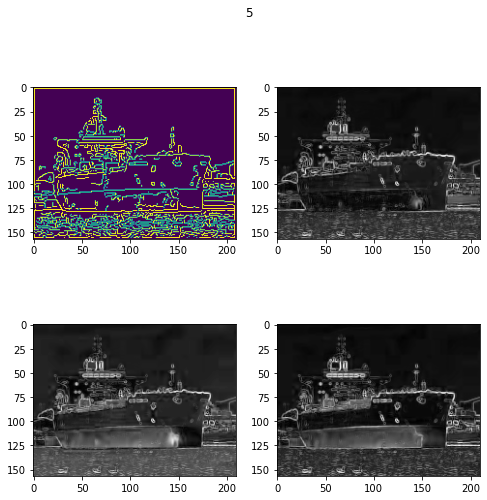

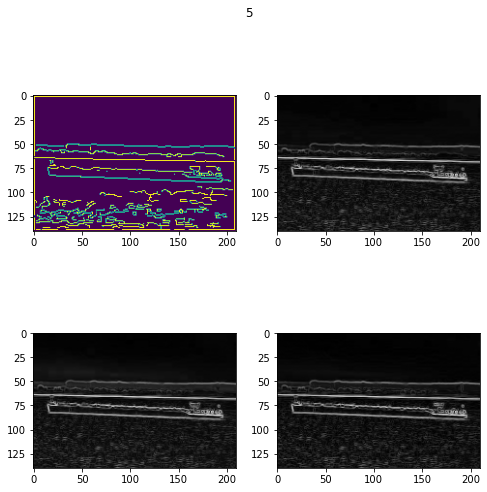

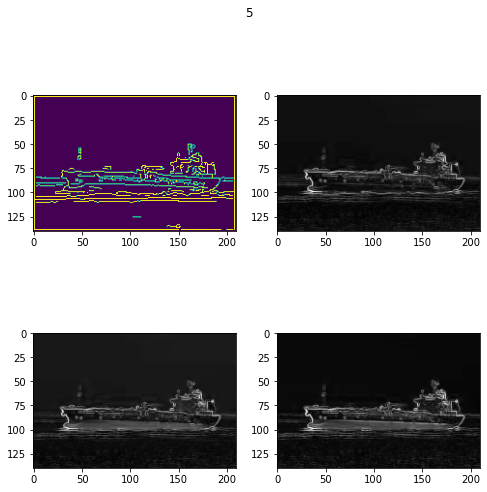

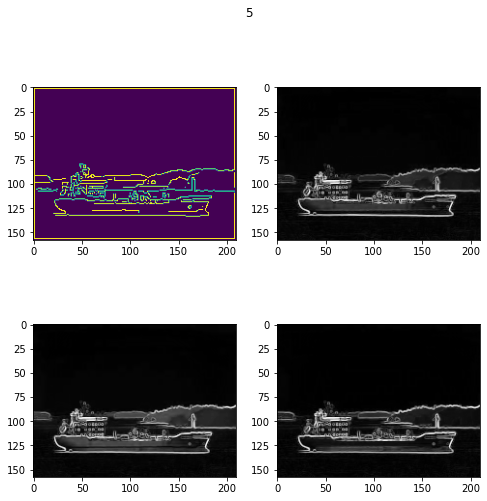

In [248]:
for category_type in train_df['category'].unique():
    edges_images_gray(category_type)

In [249]:
def hsv_images(category_type):
    category_df = train_df[train_df['category'] == category_type].reset_index(drop = True)
    for idx,i in enumerate(np.random.choice(category_df['path'],4)):  
        image = cv2.imread(i)
        hsv = color.rgb2hsv(image)
        dimension = hsv.shape
        fig = plt.figure(figsize=(8, 8))
        plt.suptitle(category_type)
        plt.subplot(2,2,1)
        plt.imshow(image)
        plt.subplot(2,2,2)
        plt.imshow(hsv[:dimension[0],:dimension[1],0], cmap="PuBuGn")
        plt.subplot(2,2,3)
        plt.imshow(hsv[:dimension[0],:dimension[1],1], cmap='PuBuGn')
        plt.subplot(2,2,4)
        plt.imshow(hsv[:dimension[0],:dimension[1],2], cmap='PuBuGn')
        plt.show()

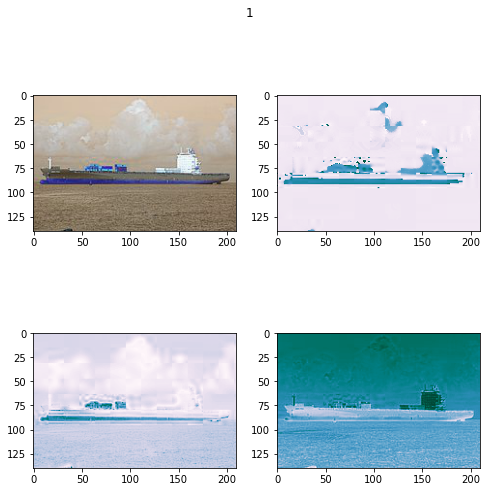

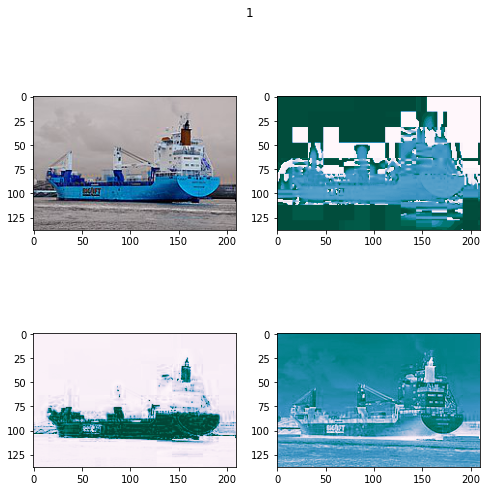

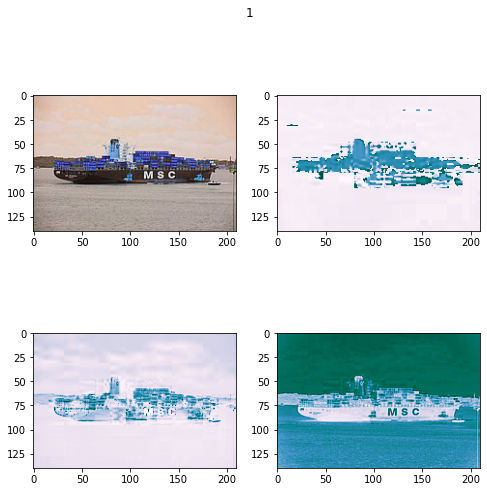

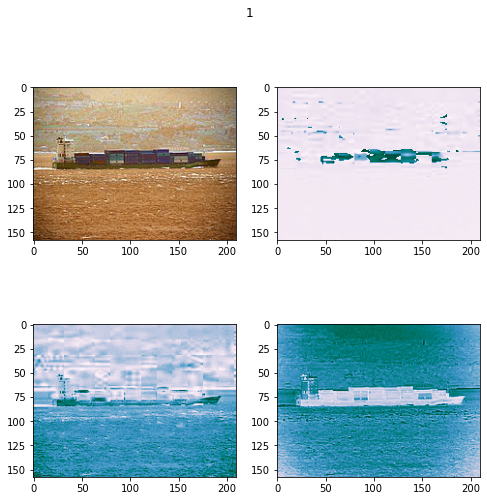

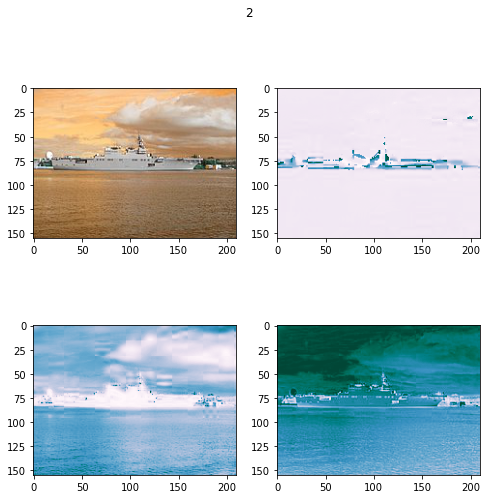

...

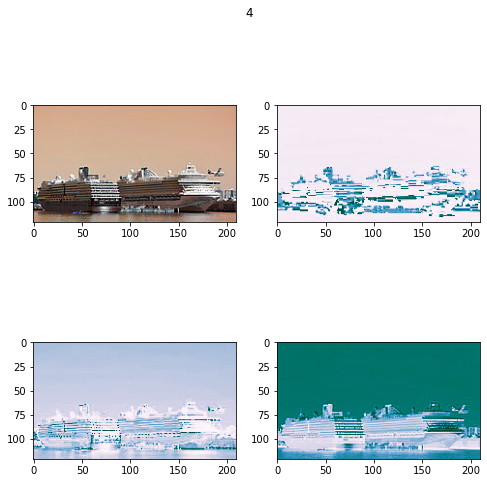

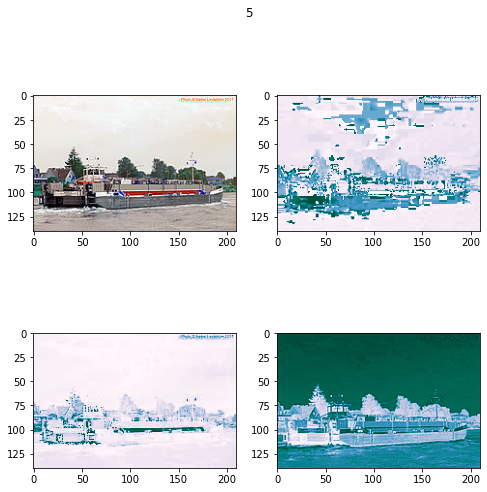

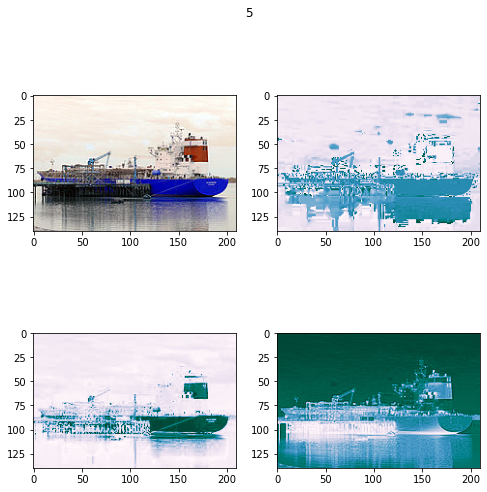

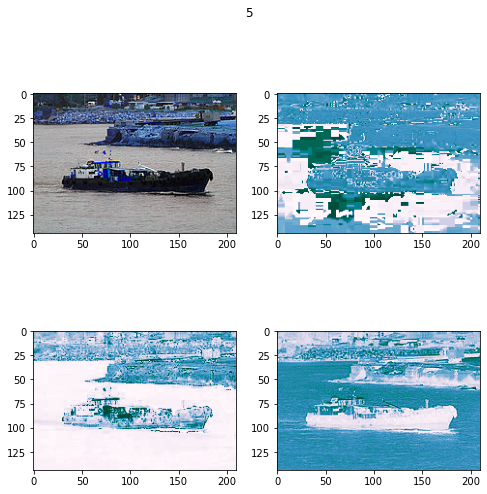

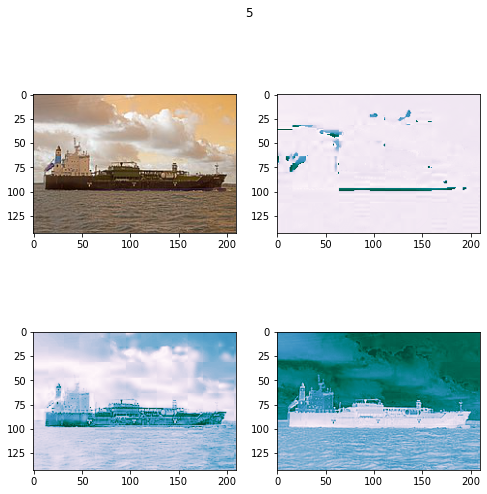

In [250]:
for category_type in train_df['category'].unique():
    hsv_images(category_type)

In [251]:
def corners_images_gray(category_type):
    category_type_df = train_df[train_df['category'] ==  category_type].reset_index(drop = True)
    for idx,i in enumerate(np.random.choice(category_type_df['path'],4)):
        image = cv2.imread(i)
        gray=cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        corners_gray = cv2.goodFeaturesToTrack(gray, maxCorners=50, qualityLevel=0.02, minDistance=20)
        corners_gray = np.float32(corners_gray)
        for item in corners_gray:
            x, y = item[0]
            cv2.circle(image, (int(x), int(y)), 6, (0, 255, 0), -1)
        fig = plt.figure(figsize=(28, 28))
        plt.suptitle(category_type)
        plt.subplot(2,2,1)
        plt.imshow(image, cmap="BuGn")
        plt.show()

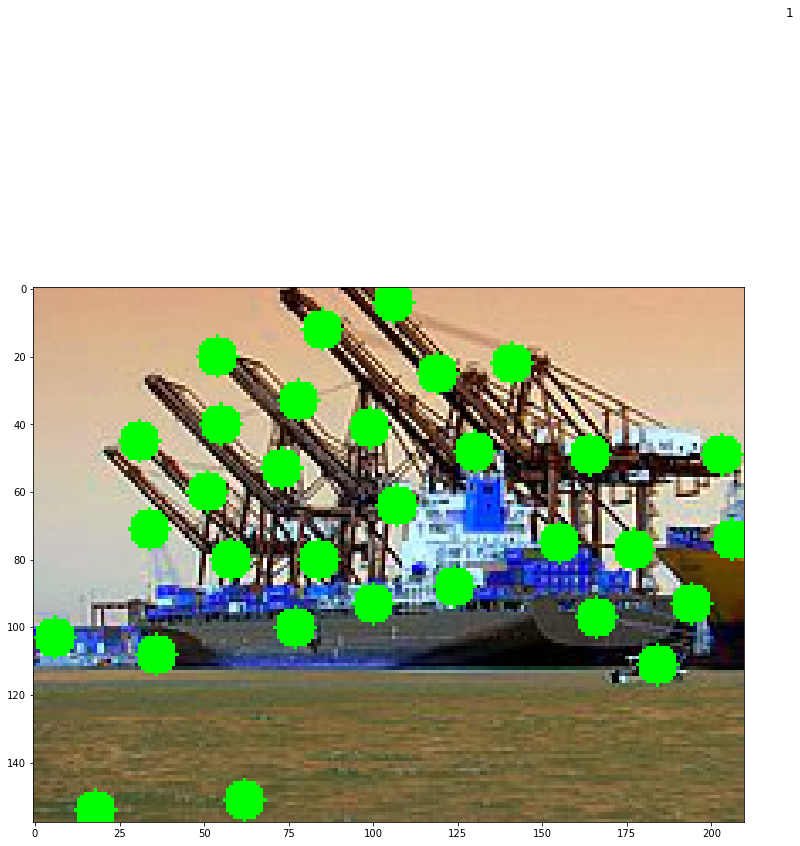

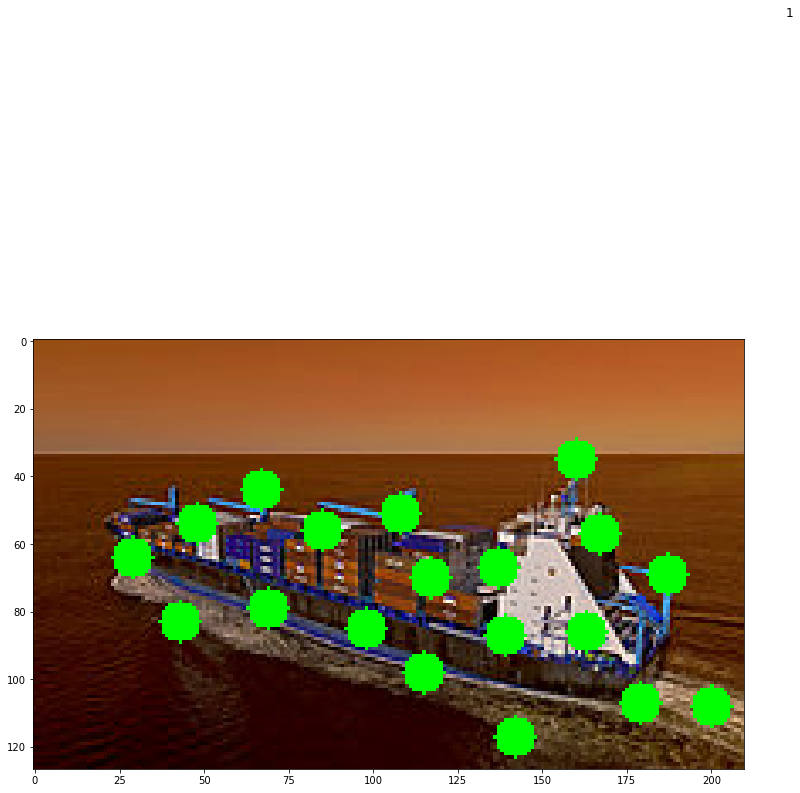

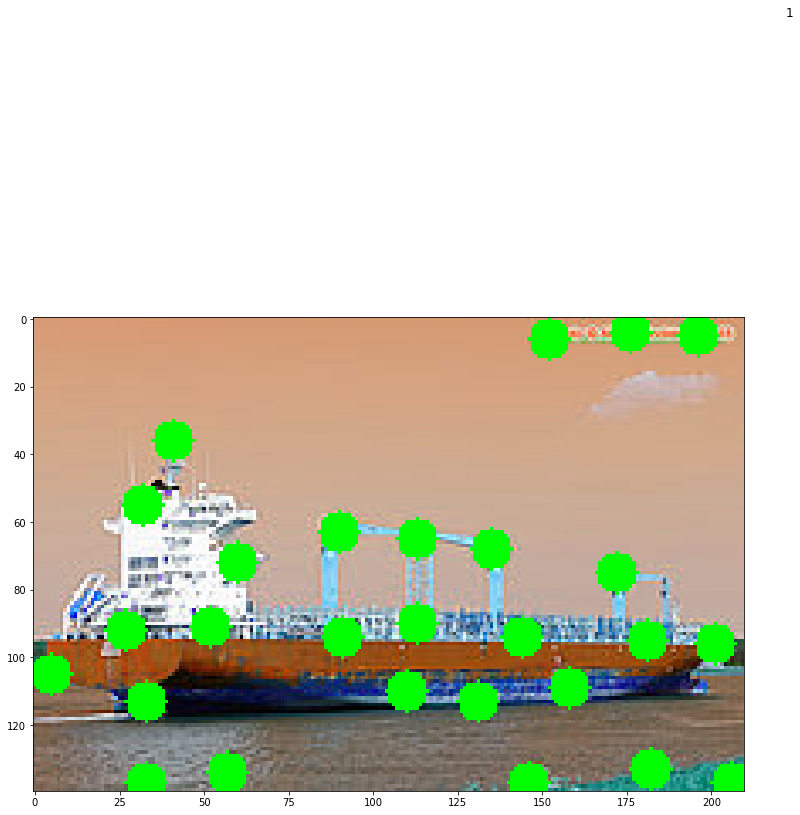

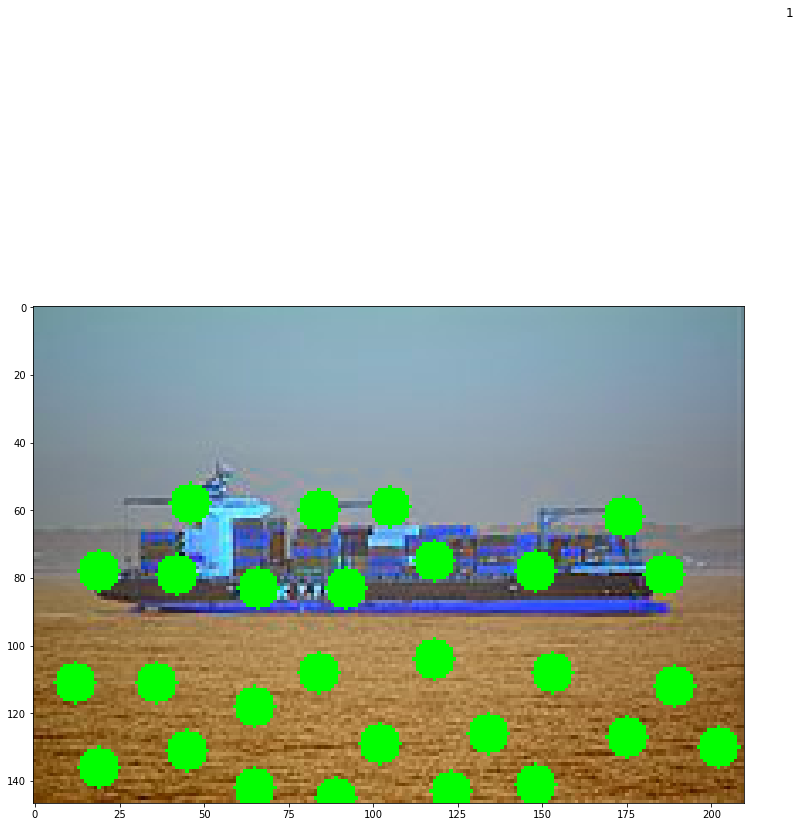

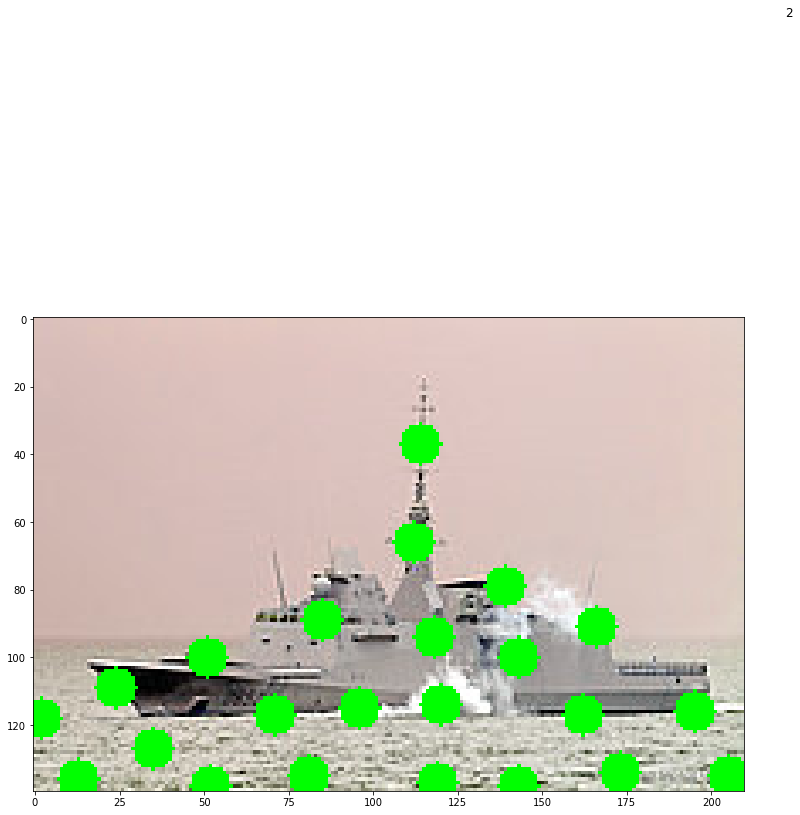

...

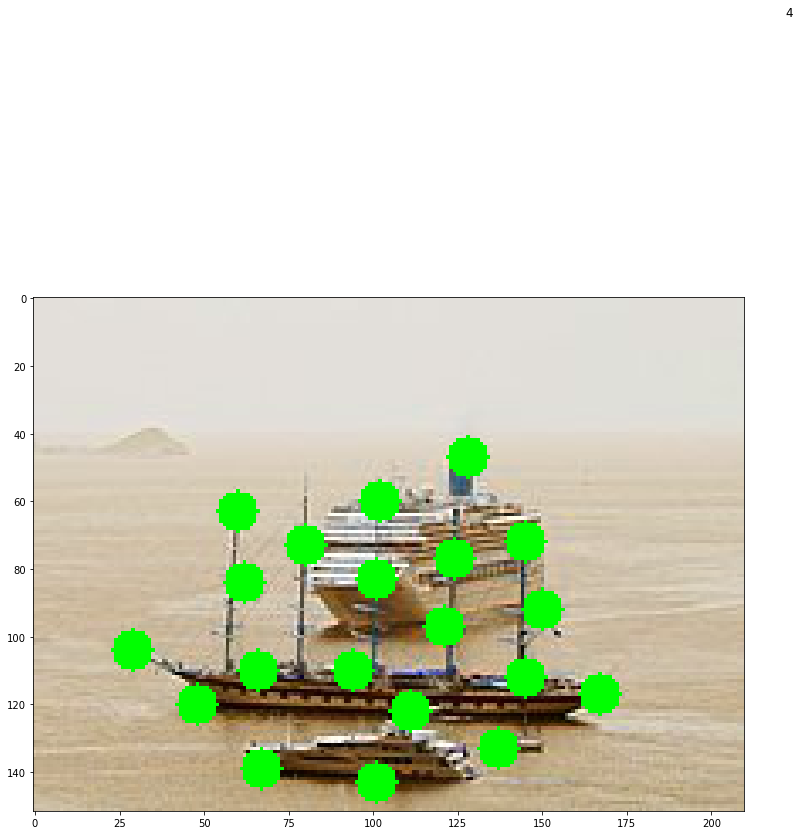

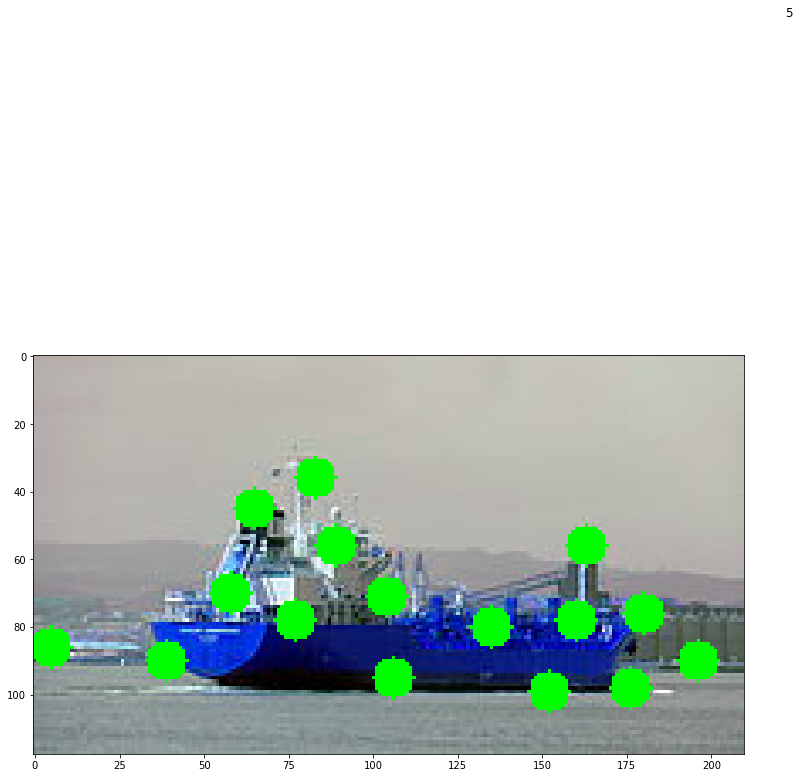

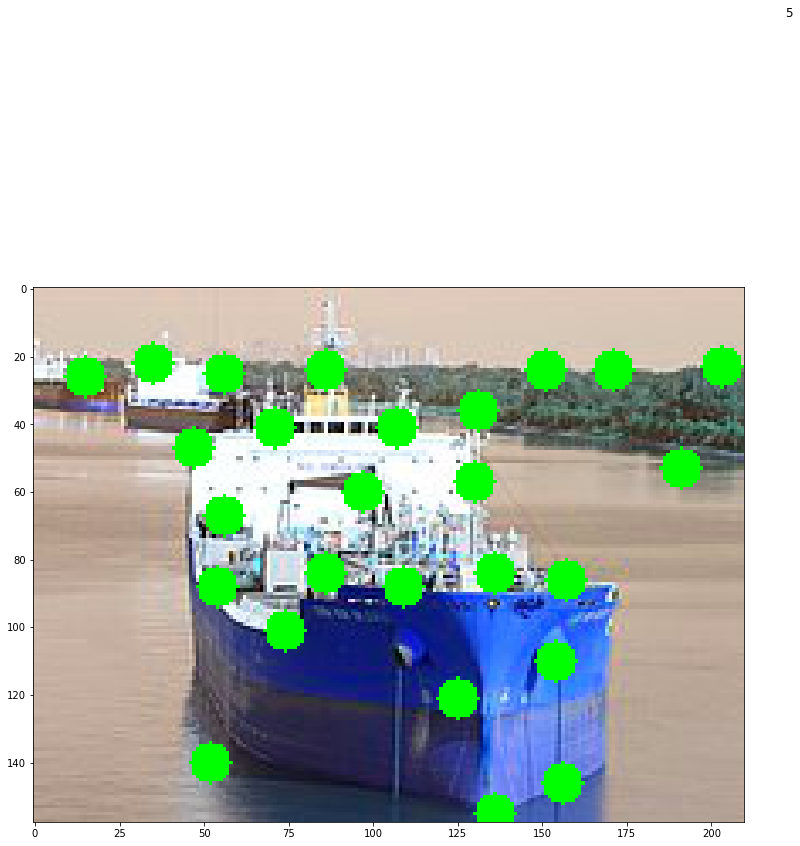

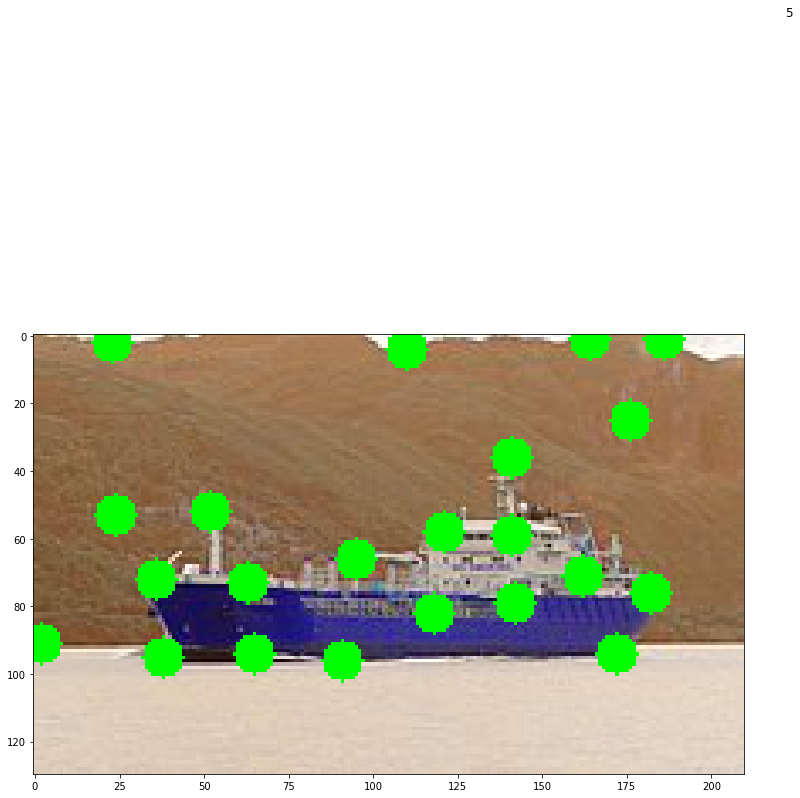

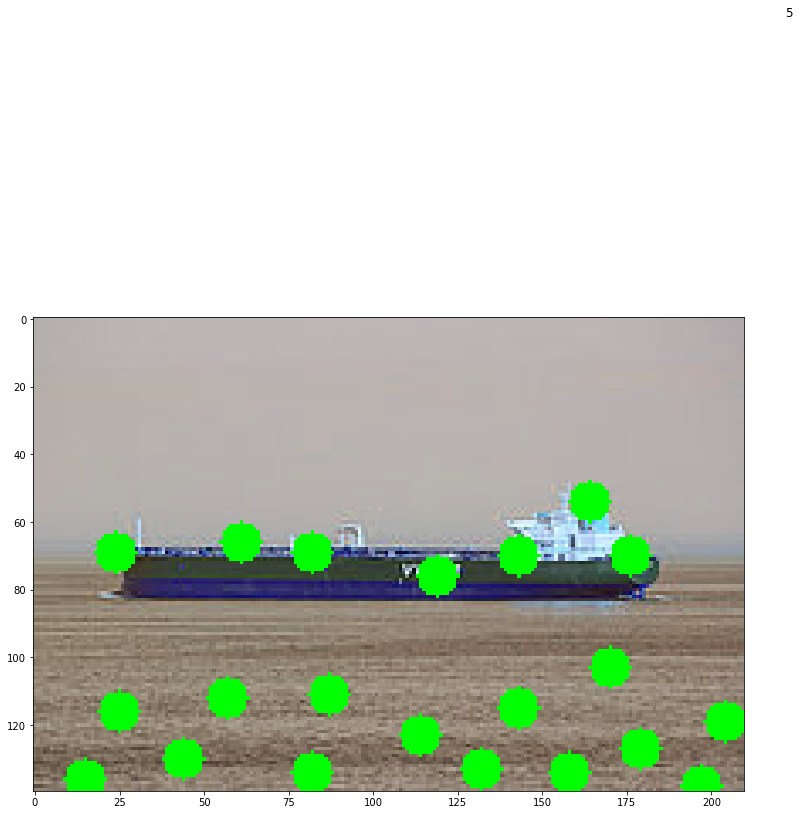

In [252]:
for category_type in train_df['category'].unique():
    corners_images_gray(category_type)

In [253]:
def sift_images_gray(category_type):
    category_type_df = train_df[train_df['category'] ==  category_type].reset_index(drop = True)
    for idx,i in enumerate(np.random.choice(category_type_df['path'],4)):
        image = cv2.imread(i)
        gray=cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        sift = cv2.SIFT_create()
        kp, des = sift.detectAndCompute(gray, None)
        kp_img = cv2.drawKeypoints(image, kp, None, color=(0, 255, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        fig = plt.figure(figsize=(32, 32))
        plt.suptitle(category_type)
        plt.subplot(2,2,1)
        plt.imshow(kp_img, cmap="viridis")
        plt.show()

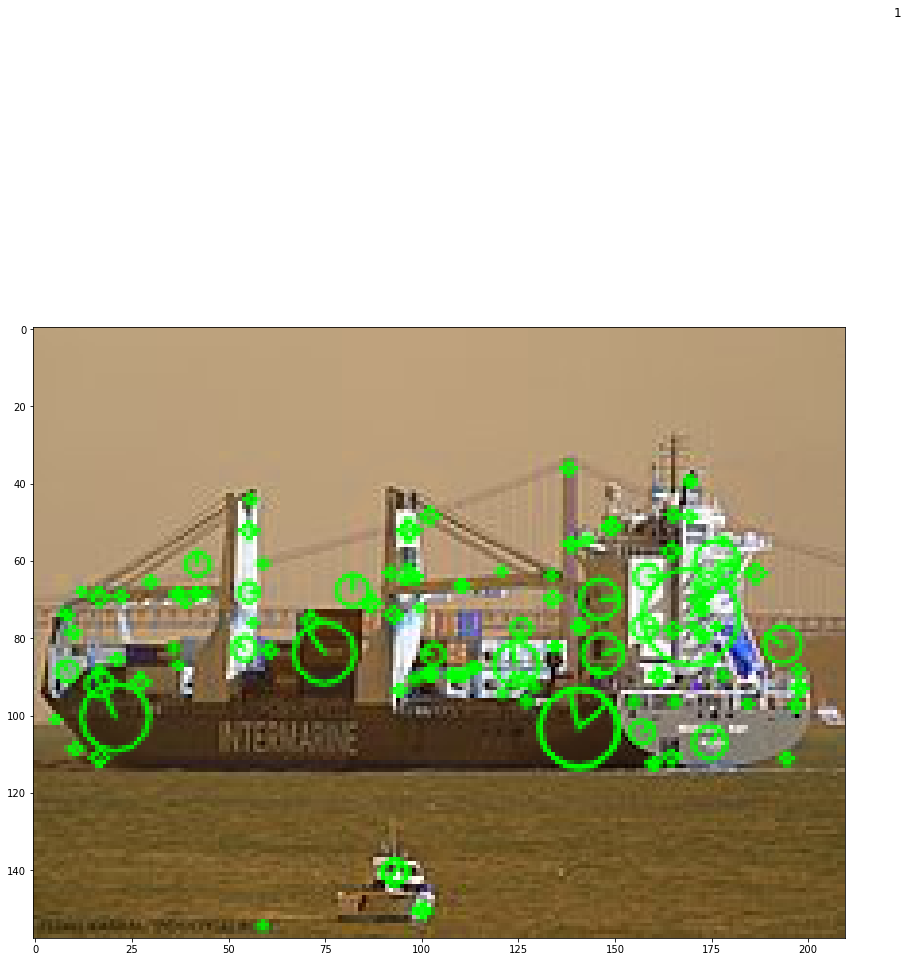

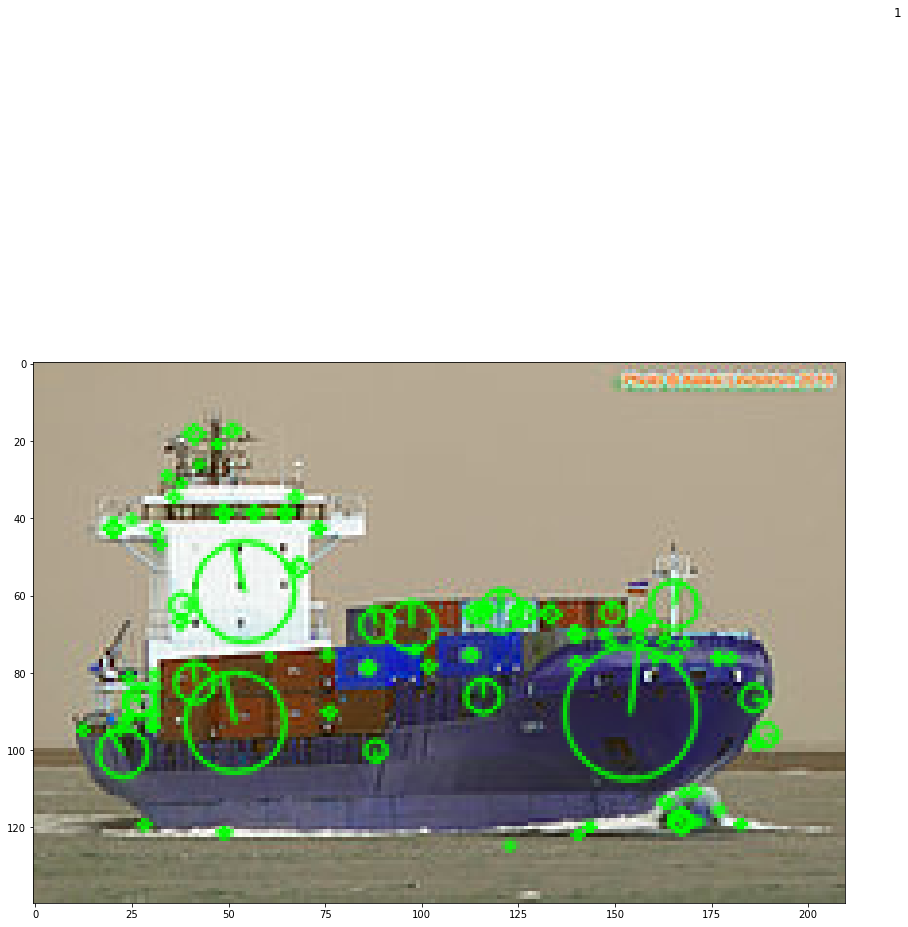

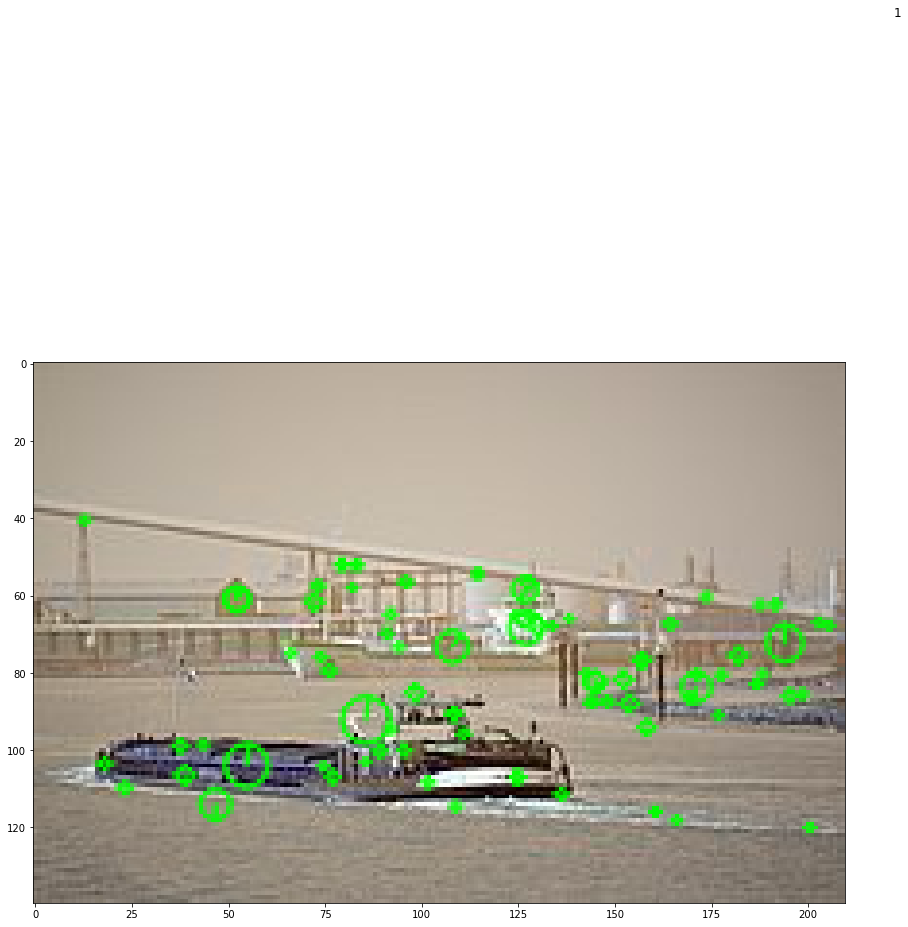

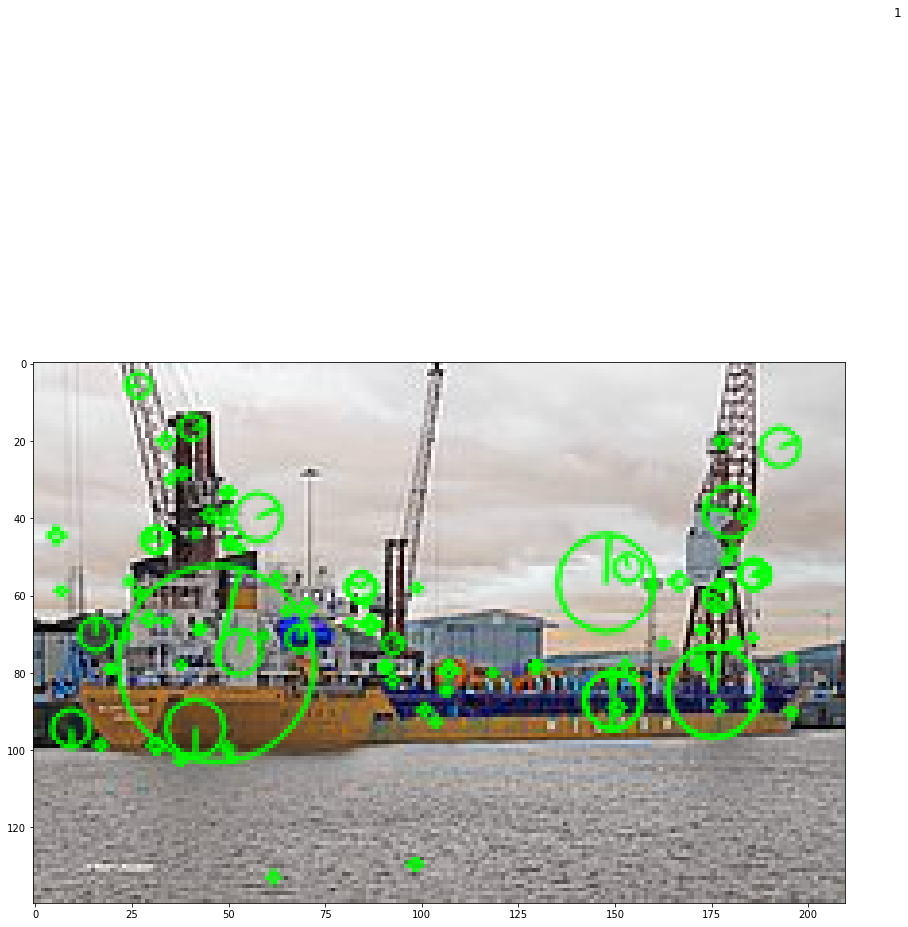

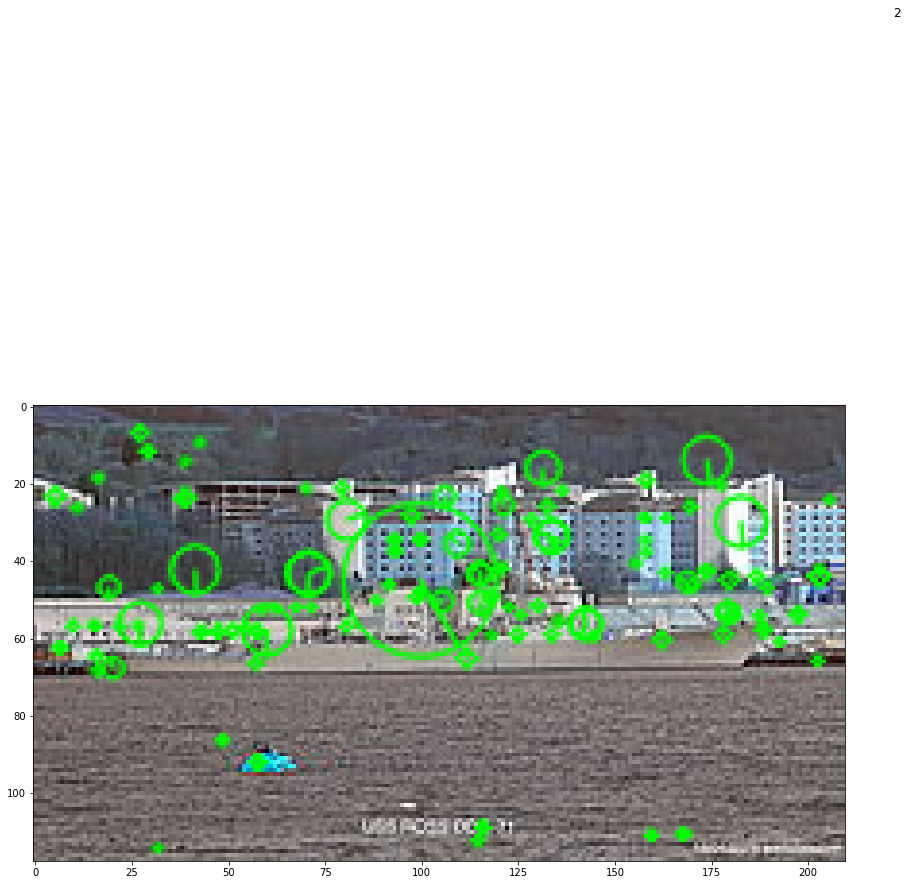

...

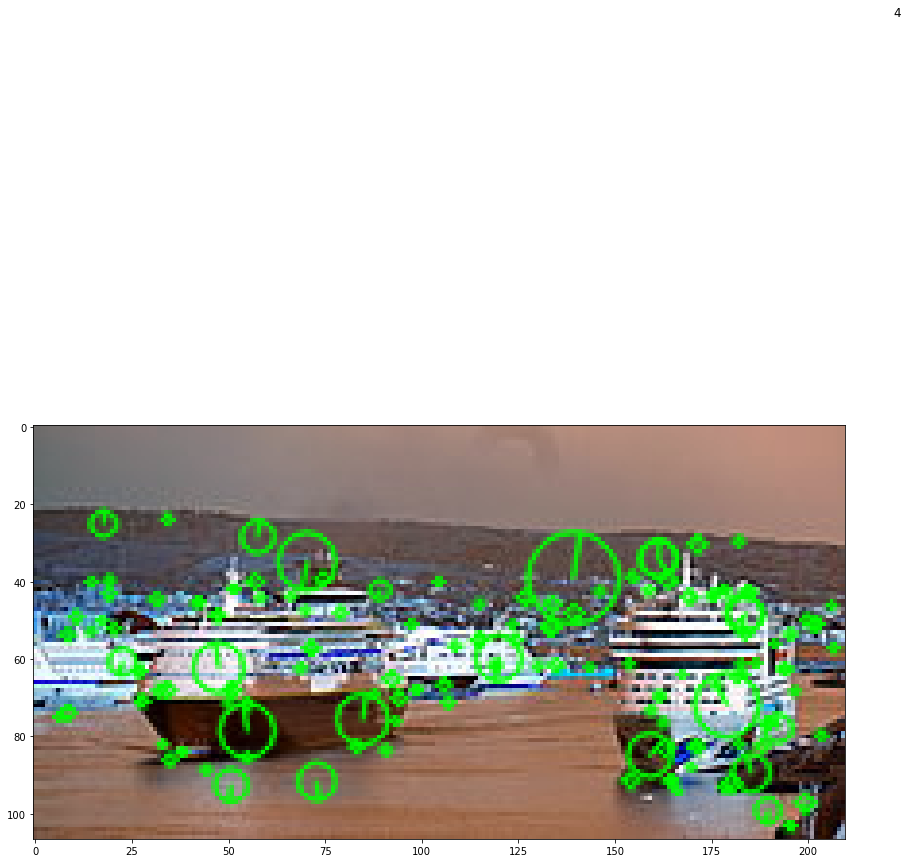

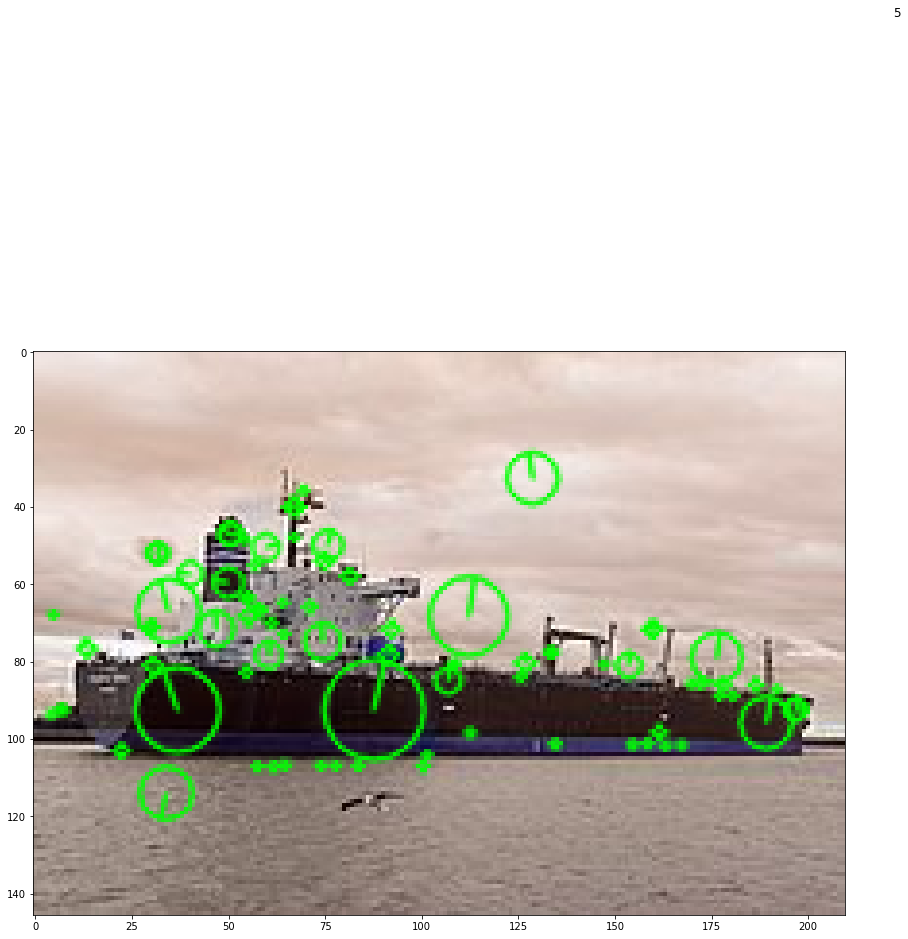

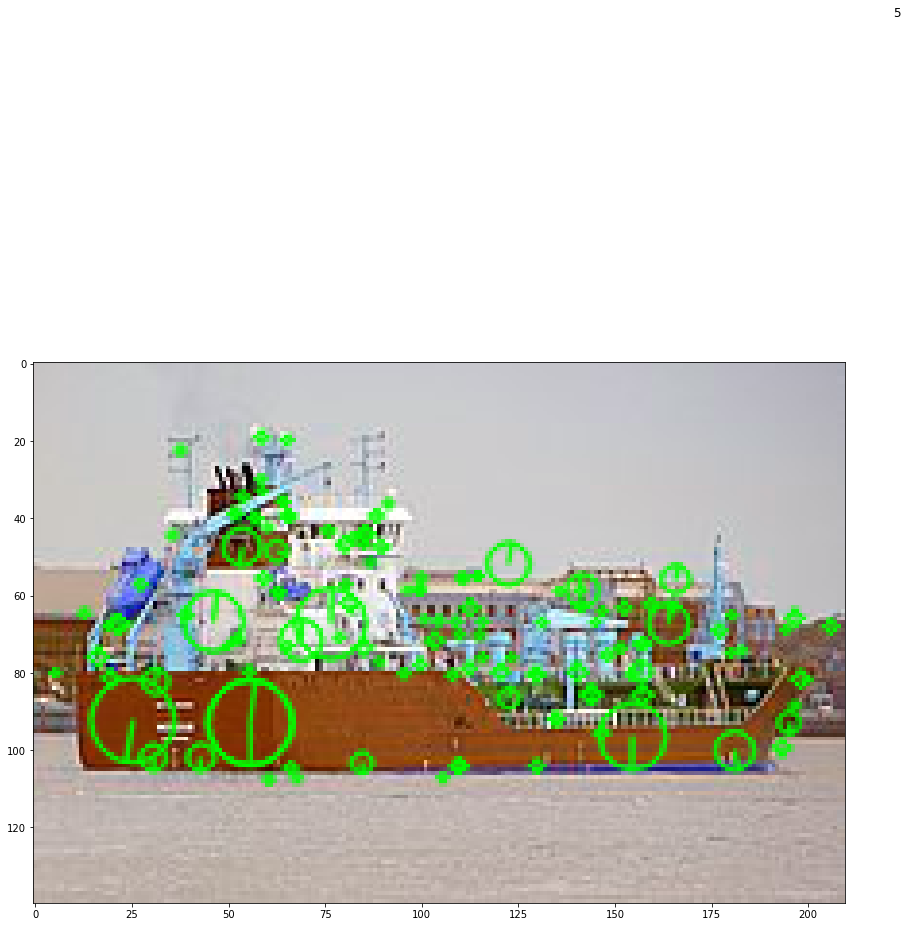

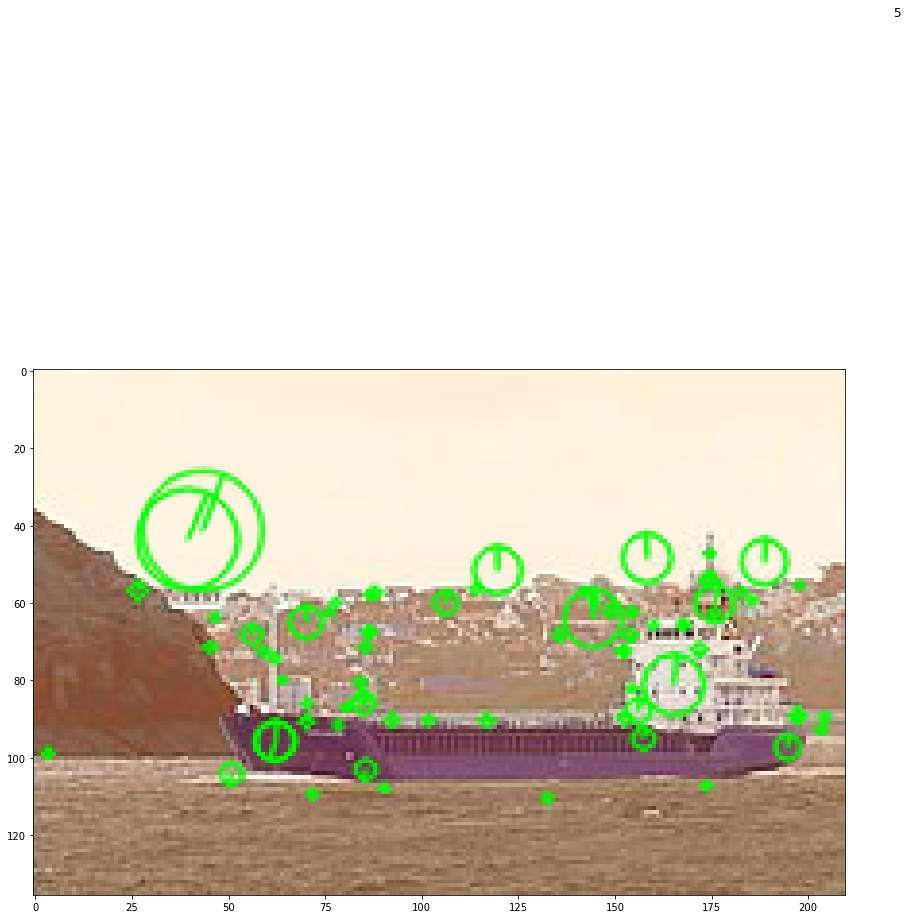

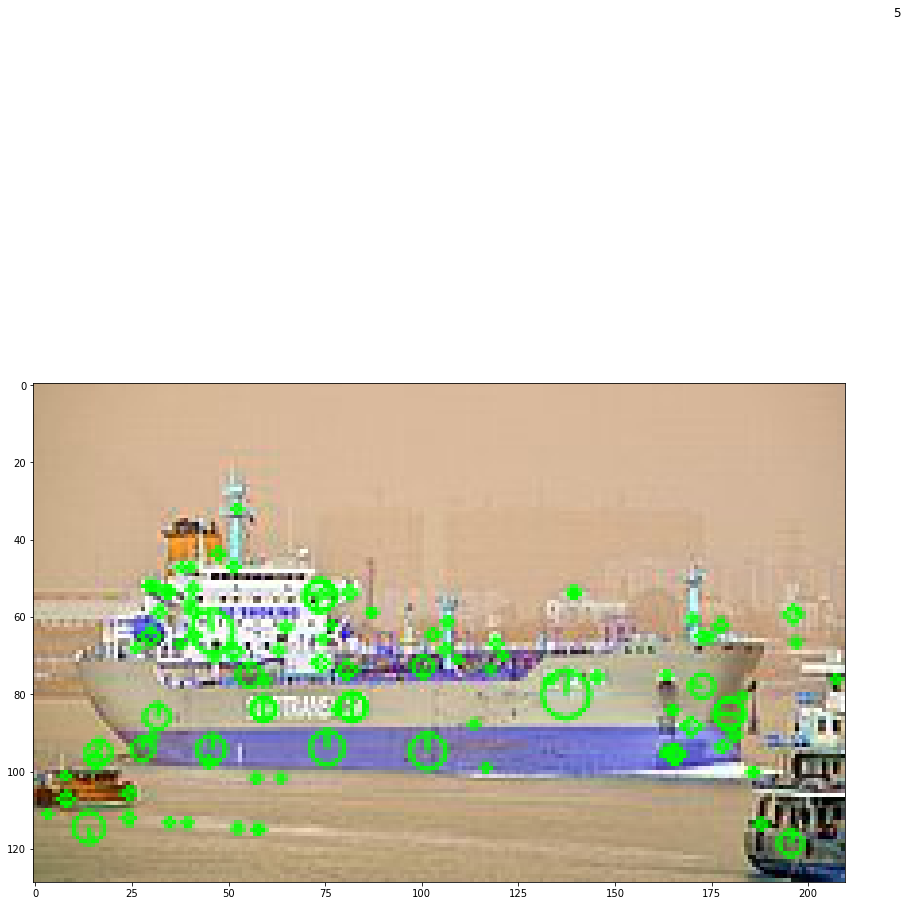

In [254]:
for category_type in train_df['category'].unique():
    sift_images_gray(category_type)

In [255]:
def hog_images(category_type):
    category_type_df = train_df[train_df['category'] ==  category_type].reset_index(drop = True)
    for idx,i in enumerate(np.random.choice(category_type_df['path'],4)):
        image = cv2.imread(i)
        fd, hog_image = hog(image, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True, channel_axis=-1)
        fig = plt.figure(figsize=(32, 32))
        plt.suptitle(category_type)
        plt.subplot(2,2,1)
        plt.imshow(hog_image, cmap="viridis")
        plt.show()

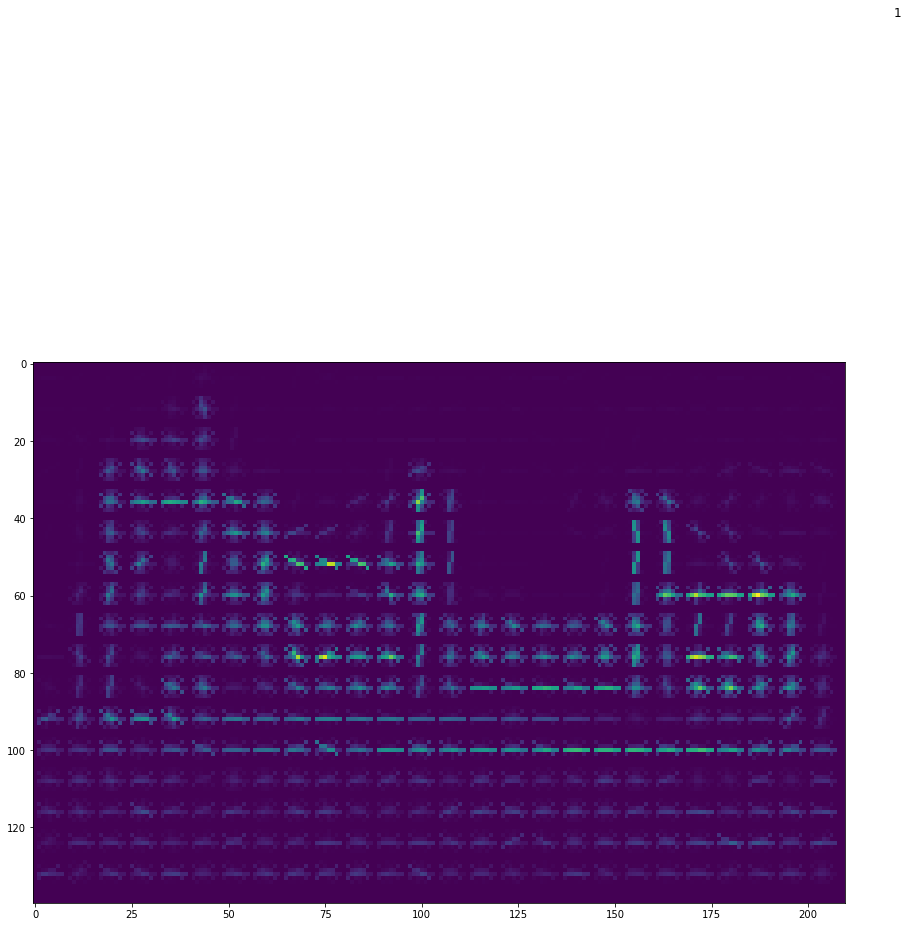

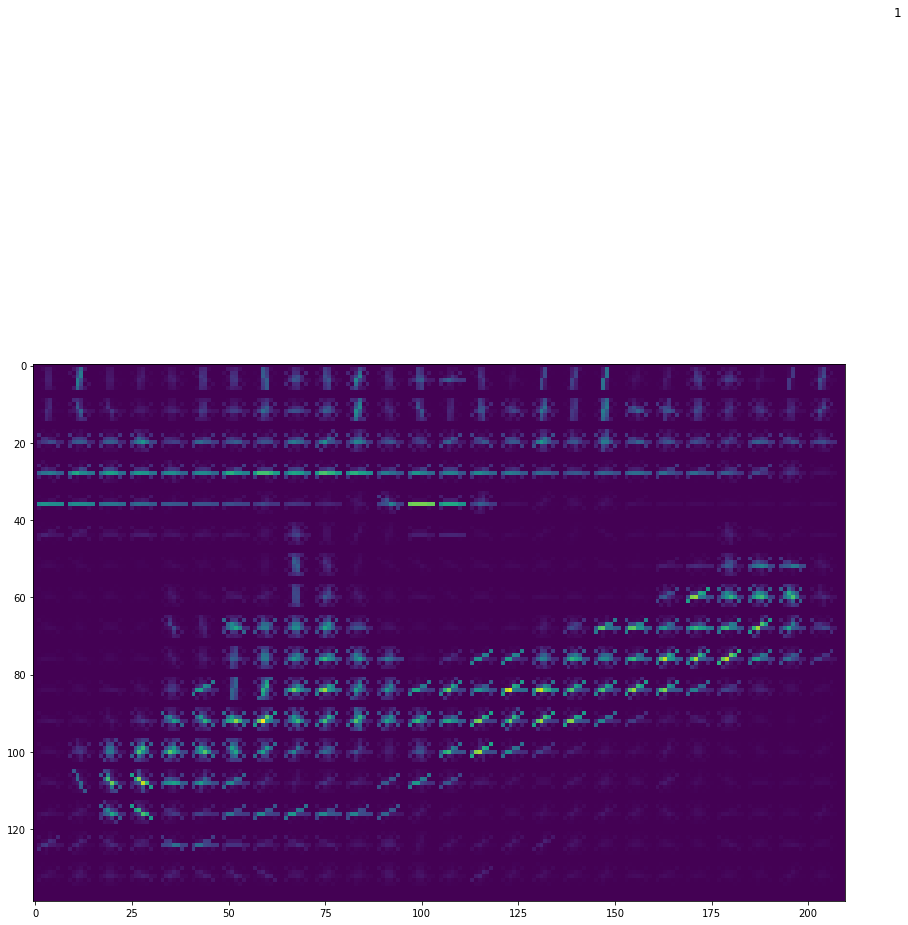

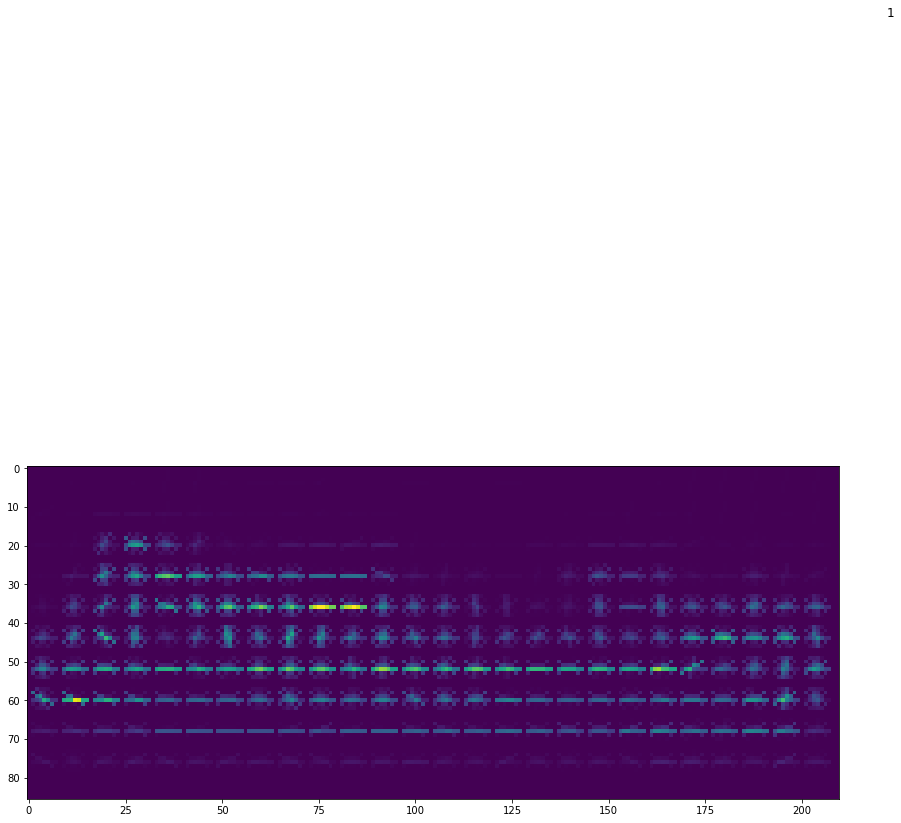

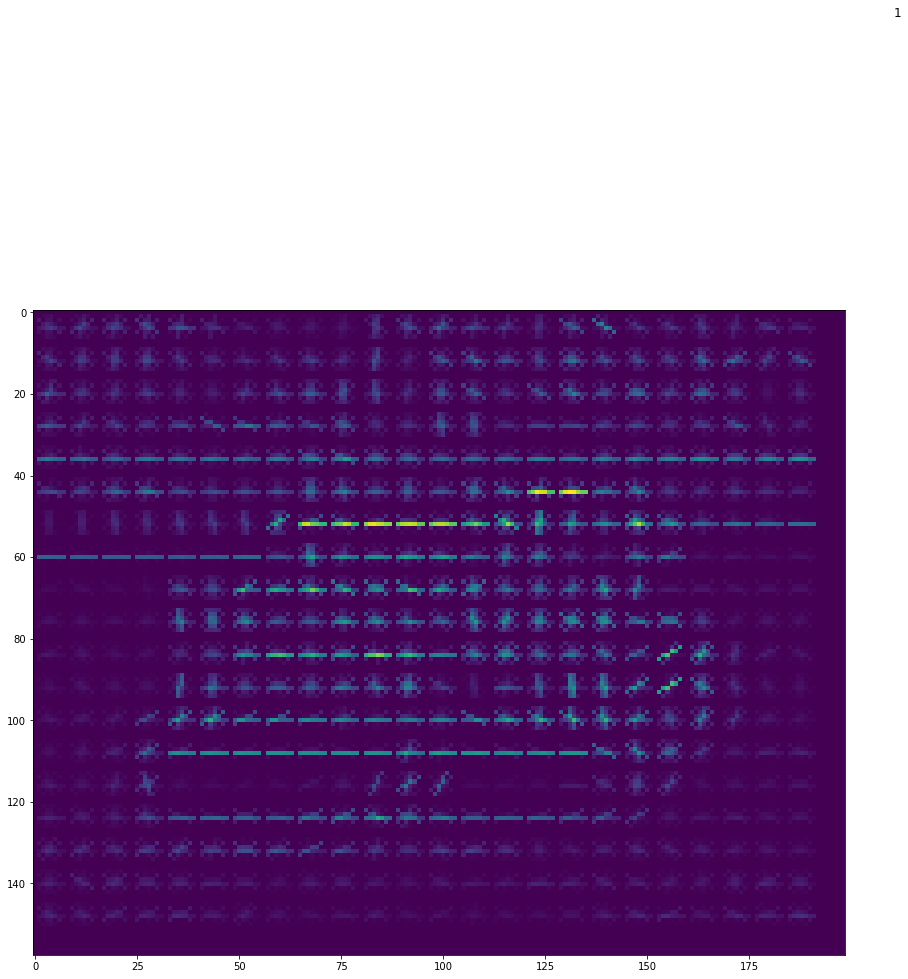

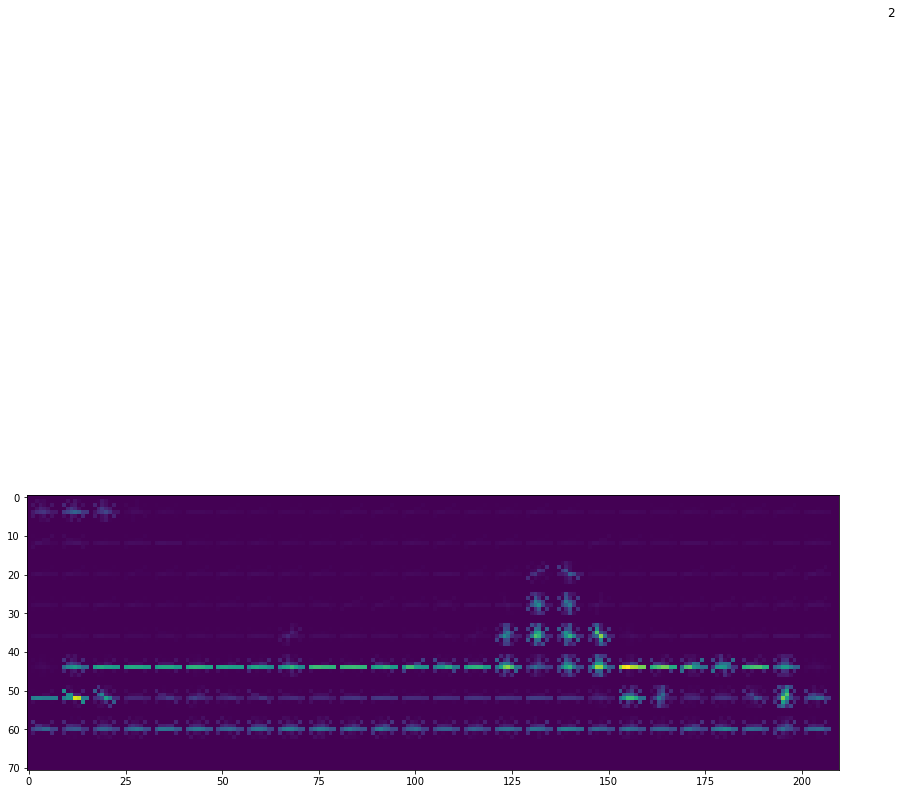

...

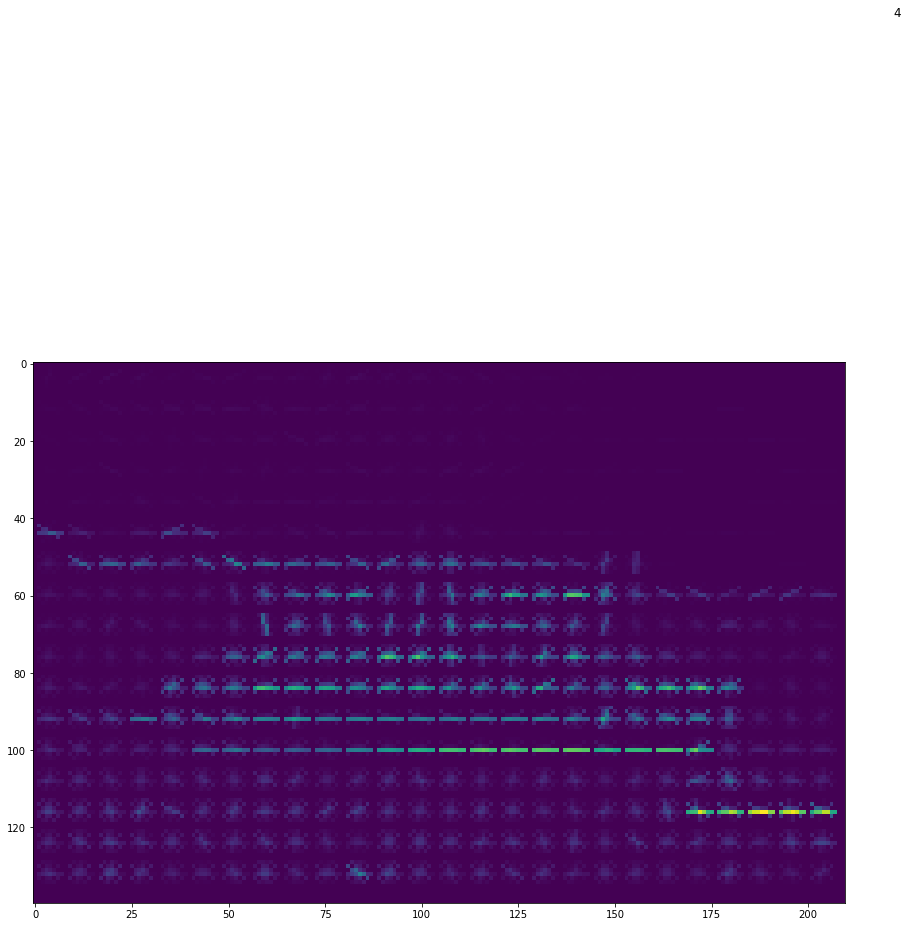

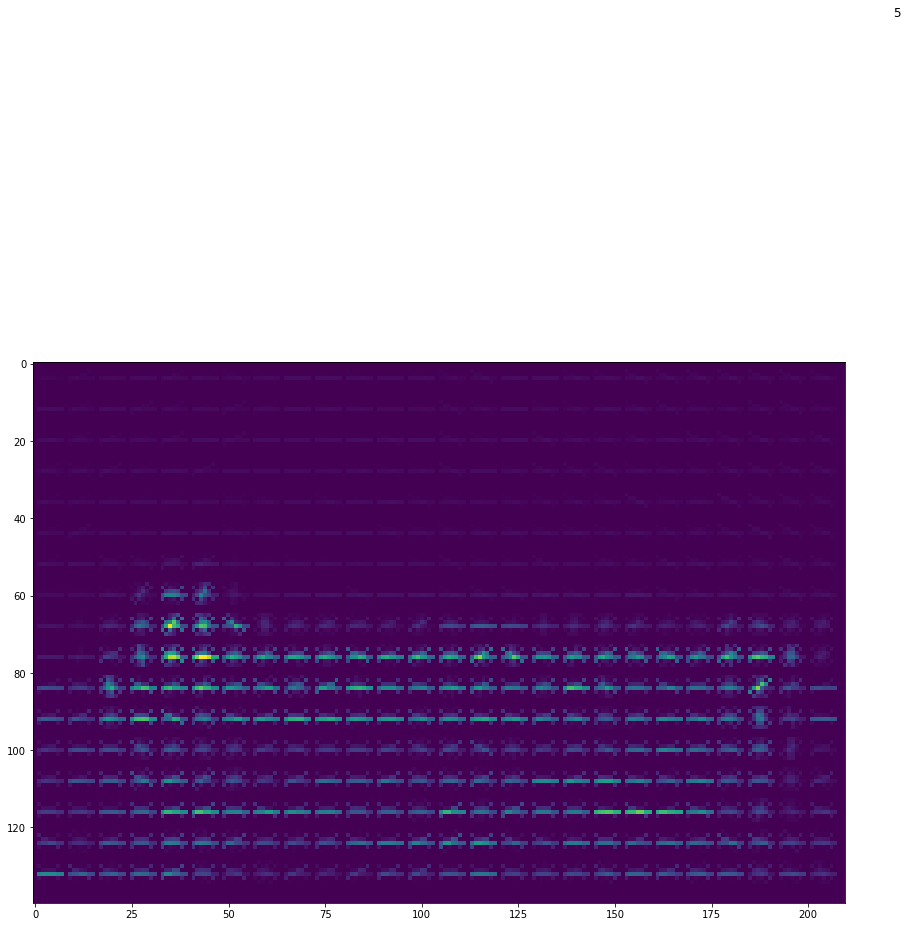

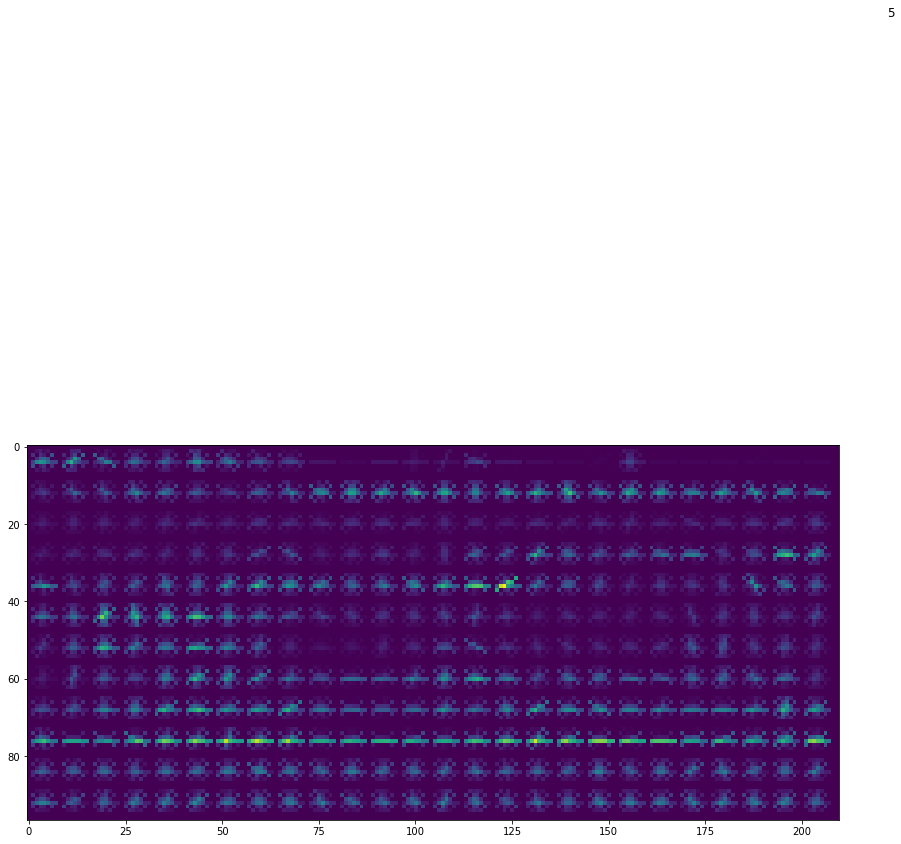

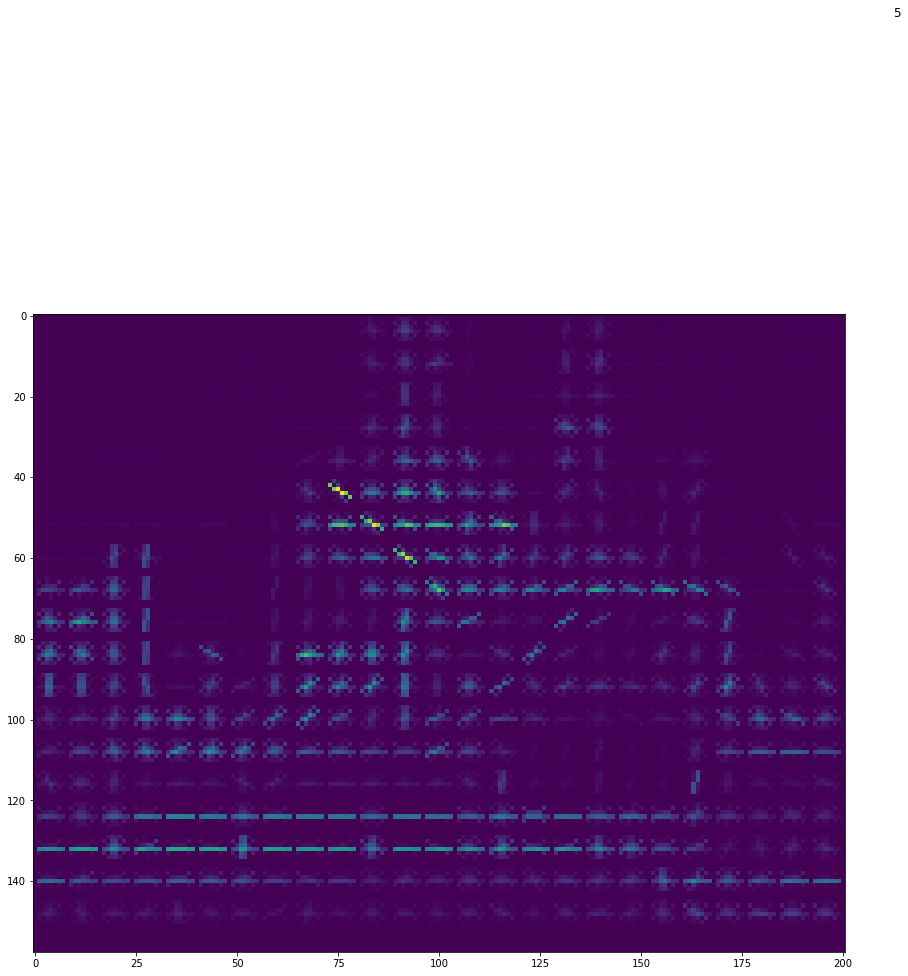

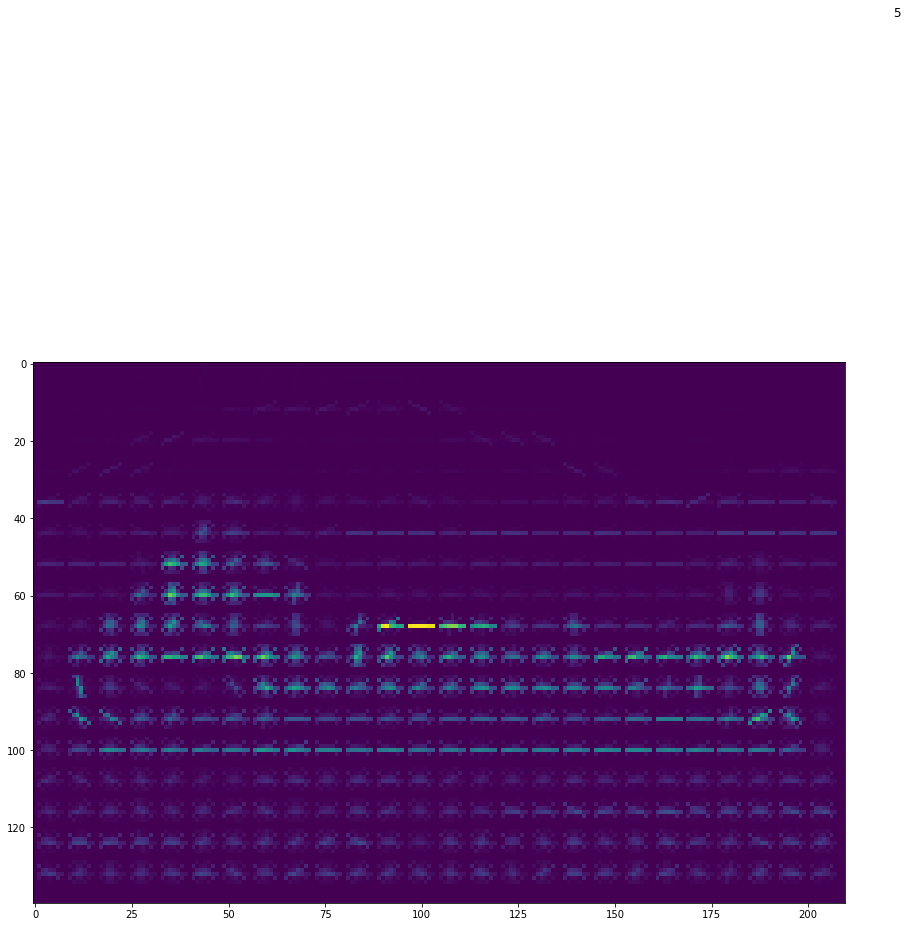

In [256]:
for category_type in train_df['category'].unique():
    hog_images(category_type)

In [257]:
def preprocess (sdir, df, trsplit, vsplit):    
    df=df.copy() 
    df.columns=['filepaths', 'labels']
    df['filepaths']= df['filepaths'].apply(lambda x: os.path.join(sdir,x ))
    df['labels']=df['labels'].astype(str) 
    # split df into train_df, test_df and valid_df
    strat=df['labels']
    dsplit=vsplit/(1-trsplit)
    train_df, dummy_df=train_test_split(df, train_size=trsplit, shuffle=True, random_state=123, stratify=strat)
    strat=dummy_df['labels']
    valid_df, test_df=train_test_split(dummy_df, train_size=dsplit, shuffle=True, random_state=123, stratify=strat)
    print('train_df length: ', len(train_df), '  test_df length: ',len(test_df), '  valid_df length: ', len(valid_df))       
    print(list(train_df['labels'].value_counts()))
    
    return train_df, test_df, valid_df

In [258]:
train_df = train_df.drop(['path','R','G','B'], axis=1)
test_df = test_df.drop('path', axis=1)

In [259]:
# create your own train, test and valid data frames
trsplit=.9 # set % of images to use for training
vsplit= .05 # set % of images to use for validation
# Note % used for test is 1-trsplit - vsplit = .05
train_df, test_df, valid_df = preprocess(sdir,train_df, trsplit, vsplit)
train_df.iloc[0]

train_df length:  5626   test_df length:  313   valid_df length:  313
[1908, 1095, 1050, 824, 749]


filepaths    C:/PythonProjects/Ship classification/train/im...
labels                                                       1
Name: 3810, dtype: object

In [260]:
def trim (df, max_size, min_size, column):
    df=df.copy()
    original_class_count= len(list(df[column].unique()))
    print ('Original Number of classes in dataframe: ', original_class_count)
    sample_list=[] 
    groups=df.groupby(column)
    for label in df[column].unique():        
        group=groups.get_group(label)
        sample_count=len(group)         
        if sample_count> max_size :
            strat=group[column]
            samples,_=train_test_split(group, train_size=max_size, shuffle=True, random_state=123, stratify=strat)            
            sample_list.append(samples)
        elif sample_count>= min_size:
            sample_list.append(group)
    df=pd.concat(sample_list, axis=0).reset_index(drop=True)
    final_class_count= len(list(df[column].unique())) 
    if final_class_count != original_class_count:
        print ('*** WARNING***  dataframe has a reduced number of classes' )
    balance=list(df[column].value_counts())
    print (balance)
    return df

In [261]:
def plot_augimages(paths, datagen):
    plt.figure(figsize = (14,28))
    plt.suptitle('Augmented Images')
    
    midx = 0
    for path in paths:
        data = Image.open(path)
        data = data.resize((192,192))
        samples = expand_dims(data, 0)
        it = datagen.flow(samples, batch_size=1)
    
        # Show Original Image
        plt.subplot(10,5, midx+1)
        plt.imshow(data)
        plt.axis('off')
    
        # Show Augmented Images
        for idx, i in enumerate(range(4)):
            midx += 1
            plt.subplot(10,5, midx+1)
            
            batch = it.next()
            image = batch[0].astype('uint8')
            plt.imshow(image)
            plt.axis('off')
        midx += 1
    
    plt.tight_layout()
    plt.show()

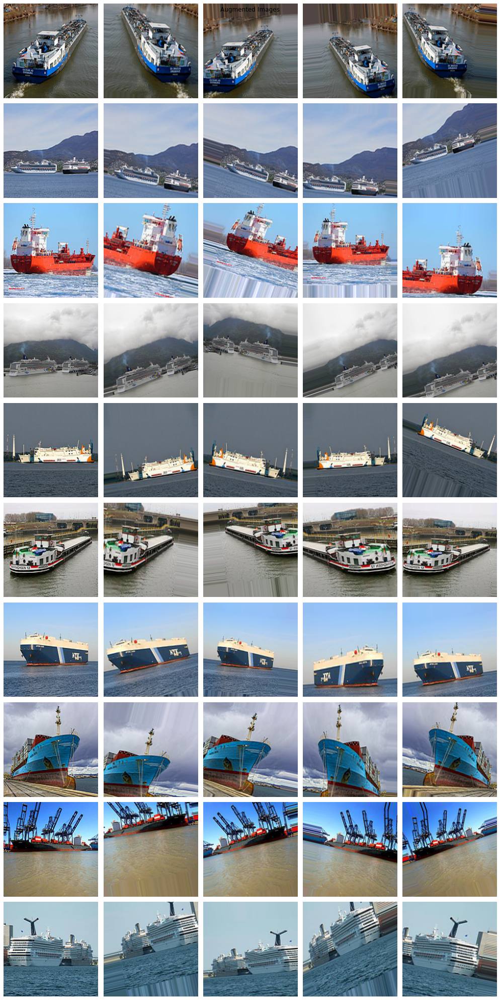

In [262]:
gen=ImageDataGenerator(horizontal_flip=True,  rotation_range=20, width_shift_range=.2,
                                  height_shift_range=.2, zoom_range=.2)
plot_augimages(np.random.choice(train_df['filepaths'],10), gen)

In [263]:
def balance(train_df,max_samples, min_samples, column, working_dir, image_size):
    train_df=train_df.copy()
    train_df=trim (train_df, max_samples, min_samples, column)    
    # make directories to store augmented images
    aug_dir=os.path.join(working_dir, 'aug')
    if os.path.isdir(aug_dir):
        shutil.rmtree(aug_dir)
    os.mkdir(aug_dir)
    for label in train_df[column].unique():    
        dir_path=os.path.join(aug_dir,label)    
        os.mkdir(dir_path)
    # create and store the augmented images  
    total=0
    gen=ImageDataGenerator(horizontal_flip=True,  rotation_range=20, width_shift_range=.2,
                                  height_shift_range=.2, zoom_range=.2)
    groups=train_df.groupby(column) # group by class
    for label in train_df[column].unique():  # for every class               
        group=groups.get_group(label)  # a dataframe holding only rows with the specified label 
        sample_count=len(group)   # determine how many samples there are in this class  
        if sample_count< max_samples: # if the class has less than target number of images
            aug_img_count=0
            delta=max_samples-sample_count  # number of augmented images to create
            target_dir=os.path.join(aug_dir, label)  # define where to write the images    
            aug_gen=gen.flow_from_dataframe( group,  x_col='filepaths', y_col=None, target_size=image_size,
                                            class_mode=None, batch_size=1, shuffle=False, 
                                            save_to_dir=target_dir, save_prefix='aug-', color_mode='rgb',
                                            save_format='jpg')
            while aug_img_count<delta:
                images=next(aug_gen)            
                aug_img_count += len(images)
            total +=aug_img_count
    print('Total Augmented images created= ', total)
    # create aug_df and merge with train_df to create composite training set ndf
    if total>0:
        aug_fpaths=[]
        aug_labels=[]
        classlist=os.listdir(aug_dir)
        for klass in classlist:
            classpath=os.path.join(aug_dir, klass)     
            flist=os.listdir(classpath)    
            for f in flist:        
                fpath=os.path.join(classpath,f)         
                aug_fpaths.append(fpath)
                aug_labels.append(klass)
        Fseries=pd.Series(aug_fpaths, name='filepaths')
        Lseries=pd.Series(aug_labels, name='labels')
        aug_df=pd.concat([Fseries, Lseries], axis=1)
        train_df=pd.concat([train_df,aug_df], axis=0).reset_index(drop=True)   
    print (list(train_df['labels'].value_counts()) )
    return train_df 

In [264]:
max_samples=740
min_samples=0
column='labels'
train_df=trim(train_df, max_samples, min_samples, column)

Original Number of classes in dataframe:  5
[740, 740, 740, 740, 740]


In [265]:
working_dir = r'./'
img_size=(150,200)
channels=3
batch_size=30
img_shape=(img_size[0],img_size[1], channels)
length=len(test_df)
test_batch_size=sorted([int(length/n) for n in range(1,length+1) if length % n ==0 and length/n<=80],reverse=True)[0]  
test_steps=int(length/test_batch_size)
print ( 'test batch size: ' ,test_batch_size, '  test steps: ', test_steps)
def scalar(img):    
    return img  # EfficientNet expects pixelsin range 0 to 255 so no scaling is required
trgen=ImageDataGenerator(preprocessing_function=scalar, horizontal_flip=True)
tvgen=ImageDataGenerator(preprocessing_function=scalar)
train_gen=trgen.flow_from_dataframe( train_df, x_col='filepaths', y_col='labels', target_size=img_size, class_mode='categorical',
                                    color_mode='rgb', shuffle=True, batch_size=batch_size)
test_gen=tvgen.flow_from_dataframe( test_df, x_col='filepaths', y_col='labels', target_size=img_size, class_mode='categorical',
                                    color_mode='rgb', shuffle=False, batch_size=test_batch_size)

valid_gen=tvgen.flow_from_dataframe( valid_df, x_col='filepaths', y_col='labels', target_size=img_size, class_mode='categorical',
                                    color_mode='rgb', shuffle=True, batch_size=batch_size)
classes=list(train_gen.class_indices.keys())
print (classes)
class_count=len(classes)
train_steps=int(np.ceil(len(train_gen.labels)/batch_size))
print('train steps: ', train_steps)

test batch size:  1   test steps:  313
Found 3700 validated image filenames belonging to 5 classes.
Found 313 validated image filenames belonging to 5 classes.
Found 313 validated image filenames belonging to 5 classes.
['1', '2', '3', '4', '5']
train steps:  124


In [266]:
def show_image_samples(gen):
    t_dict=gen.class_indices
    classes=list(t_dict.keys())    
    images,labels=next(gen) # get a sample batch from the generator 
    plt.figure(figsize=(20, 20))
    length=len(labels)
    if length<20:   #show maximum of 25 images
        r=length
    else:
        r=20
    for i in range(r):
        plt.subplot(5, 5, i + 1)
        image=images[i]/255
        plt.imshow(image)
        index=np.argmax(labels[i])
        class_name=classes[index]
        plt.title(class_name, color='black', fontsize=12)
        plt.axis('off')
    plt.show()

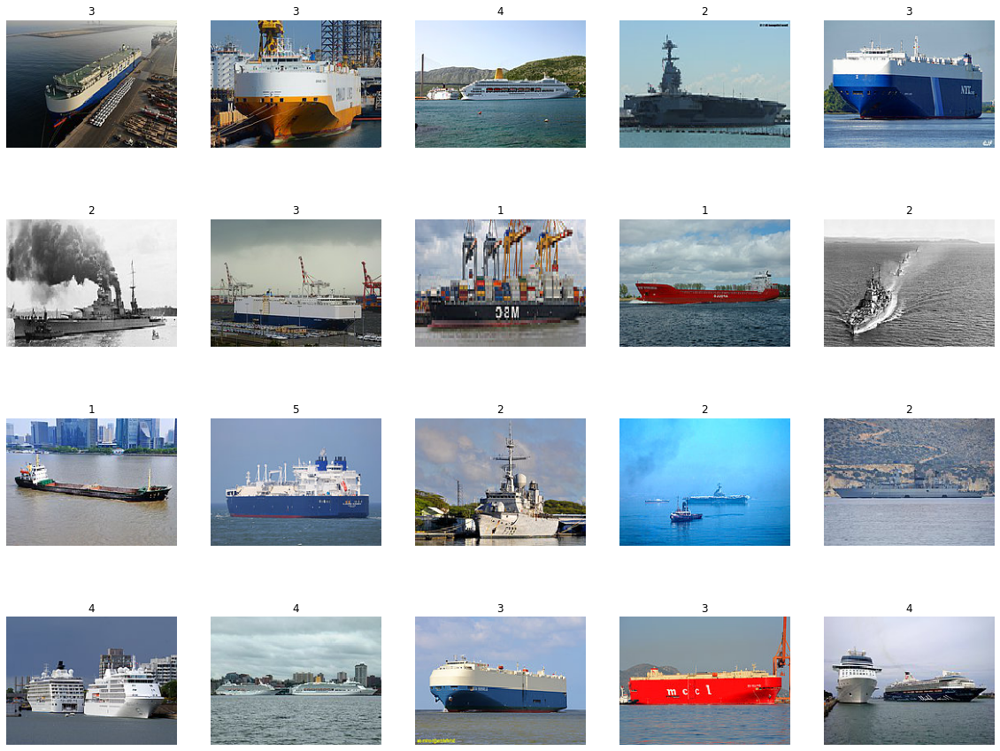

In [267]:
show_image_samples(train_gen)

In [268]:
model_name='EfficientNetB3'
base_model=tf.keras.applications.EfficientNetB3(include_top=False, weights="imagenet",input_shape=img_shape, pooling='max') 
x=base_model.output
x=keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001 )(x)
x = Dense(256, kernel_regularizer = regularizers.l2(l = 0.016),activity_regularizer=regularizers.l1(0.006),
                bias_regularizer=regularizers.l1(0.006) ,activation='relu')(x)
x=Dropout(rate=.45, seed=123)(x)        
output=Dense(class_count, activation='softmax')(x)
model=Model(inputs=base_model.input, outputs=output)
model.compile(Adamax(learning_rate=.001), loss='categorical_crossentropy', metrics=['accuracy']) 

In [269]:
class LRA(keras.callbacks.Callback):
    def __init__(self,model, base_model, patience,stop_patience, threshold, factor, dwell, batches, initial_epoch,epochs, ask_epoch):
        super(LRA, self).__init__()
        self.model=model
        self.base_model=base_model
        self.patience=patience # specifies how many epochs without improvement before learning rate is adjusted
        self.stop_patience=stop_patience # specifies how many times to adjust lr without improvement to stop training
        self.threshold=threshold # specifies training accuracy threshold when lr will be adjusted based on validation loss
        self.factor=factor # factor by which to reduce the learning rate
        self.dwell=dwell
        self.batches=batches # number of training batch to runn per epoch
        self.initial_epoch=initial_epoch
        self.epochs=epochs
        self.ask_epoch=ask_epoch
        self.ask_epoch_initial=ask_epoch # save this value to restore if restarting training
        # callback variables 
        self.count=0 # how many times lr has been reduced without improvement
        self.stop_count=0        
        self.best_epoch=1   # epoch with the lowest loss        
        self.initial_lr=float(tf.keras.backend.get_value(model.optimizer.lr)) # get the initiallearning rate and save it         
        self.highest_tracc=0.0 # set highest training accuracy to 0 initially
        self.lowest_vloss=np.inf # set lowest validation loss to infinity initially
        self.best_weights=self.model.get_weights() # set best weights to model's initial weights
        self.initial_weights=self.model.get_weights()   # save initial weights if they have to get restored 
        
    def on_train_begin(self, logs=None):        
        if self.base_model != None:
            status=base_model.trainable
            if status:
                msg=' initializing callback starting train with base_model trainable'
            else:
                msg='initializing callback starting training with base_model not trainable'
        else:
            msg='initialing callback and starting training'                        
        print(msg) 
        msg='{0:^8s}{1:^10s}{2:^9s}{3:^9s}{4:^9s}{5:^9s}{6:^9s}{7:^10s}{8:10s}{9:^8s}'.format('Epoch', 'Loss', 'Accuracy',
                                                                                              'V_loss','V_acc', 'LR', 'Next LR', 'Monitor','% Improv', 'Duration')
        print(msg) 
        self.start_time= time.time()
        
    def on_train_end(self, logs=None):
        stop_time=time.time()
        tr_duration= stop_time- self.start_time            
        hours = tr_duration // 3600
        minutes = (tr_duration - (hours * 3600)) // 60
        seconds = tr_duration - ((hours * 3600) + (minutes * 60))

        self.model.set_weights(self.best_weights) # set the weights of the model to the best weights
        msg=f'Training is completed - model is set with weights from epoch {self.best_epoch} '
        print(msg)
        msg = f'training elapsed time was {str(hours)} hours, {minutes:4.1f} minutes, {seconds:4.2f} seconds)'
        print(msg)   
        
    def on_train_batch_end(self, batch, logs=None):
        acc=logs.get('accuracy')* 100  # get training accuracy 
        loss=logs.get('loss')
        msg='{0:20s}processing batch {1:4s} of {2:5s} accuracy= {3:8.3f}  loss: {4:8.5f}'.format(' ', str(batch), str(self.batches), acc, loss)
        print(msg, '\r', end='') # prints over on the same line to show running batch count        
        
    def on_epoch_begin(self,epoch, logs=None):
        self.now= time.time()
        
    def on_epoch_end(self, epoch, logs=None):  # method runs on the end of each epoch
        later=time.time()
        duration=later-self.now 
        lr=float(tf.keras.backend.get_value(self.model.optimizer.lr)) # get the current learning rate
        current_lr=lr
        v_loss=logs.get('val_loss')  # get the validation loss for this epoch
        acc=logs.get('accuracy')  # get training accuracy 
        v_acc=logs.get('val_accuracy')
        loss=logs.get('loss')        
        if acc < self.threshold: # if training accuracy is below threshold adjust lr based on training accuracy
            monitor='accuracy'
            if epoch ==0:
                pimprov=0.0
            else:
                pimprov= (acc-self.highest_tracc )*100/self.highest_tracc
            if acc>self.highest_tracc: # training accuracy improved in the epoch                
                self.highest_tracc=acc # set new highest training accuracy
                self.best_weights=self.model.get_weights() # traing accuracy improved so save the weights
                self.count=0 # set count to 0 since training accuracy improved
                self.stop_count=0 # set stop counter to 0
                if v_loss<self.lowest_vloss:
                    self.lowest_vloss=v_loss
                self.best_epoch=epoch + 1  # set the value of best epoch for this epoch              
            else: 
                # training accuracy did not improve check if this has happened for patience number of epochs
                # if so adjust learning rate
                if self.count>=self.patience -1: # lr should be adjusted
                    lr= lr* self.factor # adjust the learning by factor
                    tf.keras.backend.set_value(self.model.optimizer.lr, lr) # set the learning rate in the optimizer
                    self.count=0 # reset the count to 0
                    self.stop_count=self.stop_count + 1 # count the number of consecutive lr adjustments
                    self.count=0 # reset counter
                    if self.dwell:
                        self.model.set_weights(self.best_weights) # return to better point in N space                        
                    else:
                        if v_loss<self.lowest_vloss:
                            self.lowest_vloss=v_loss                                    
                else:
                    self.count=self.count +1 # increment patience counter                    
        else: # training accuracy is above threshold so adjust learning rate based on validation loss
            monitor='val_loss'
            if epoch ==0:
                pimprov=0.0
            else:
                pimprov= (self.lowest_vloss- v_loss )*100/self.lowest_vloss
            if v_loss< self.lowest_vloss: # check if the validation loss improved 
                self.lowest_vloss=v_loss # replace lowest validation loss with new validation loss                
                self.best_weights=self.model.get_weights() # validation loss improved so save the weights
                self.count=0 # reset count since validation loss improved  
                self.stop_count=0                
                self.best_epoch=epoch + 1 # set the value of the best epoch to this epoch
            else: # validation loss did not improve
                if self.count>=self.patience-1: # need to adjust lr
                    lr=lr * self.factor # adjust the learning rate                    
                    self.stop_count=self.stop_count + 1 # increment stop counter because lr was adjusted 
                    self.count=0 # reset counter
                    tf.keras.backend.set_value(self.model.optimizer.lr, lr) # set the learning rate in the optimizer
                    if self.dwell:
                        self.model.set_weights(self.best_weights) # return to better point in N space
                else: 
                    self.count =self.count +1 # increment the patience counter                    
                if acc>self.highest_tracc:
                    self.highest_tracc= acc
        msg=f'{str(epoch+1):^3s}/{str(self.epochs):4s} {loss:^9.3f}{acc*100:^9.3f}{v_loss:^9.5f}{v_acc*100:^9.3f}{current_lr:^9.5f}{lr:^9.5f}{monitor:^11s}{pimprov:^10.2f}{duration:^8.2f}'
        print(msg)
        if self.stop_count> self.stop_patience - 1: # check if learning rate has been adjusted stop_count times with no improvement
            msg=f' training has been halted at epoch {epoch + 1} after {self.stop_patience} adjustments of learning rate with no improvement'
            print(msg)
            self.model.stop_training = True # stop training
        else: 
            if self.ask_epoch !=None:
                if epoch + 1 >= self.ask_epoch:
                    if base_model.trainable:
                        msg='enter H to halt  or an integer for number of epochs to run then ask again'
                    else:
                        msg='enter H to halt ,F to fine tune model, or an integer for number of epochs to run then ask again'
                    print(msg)
                    ans=input('')
                    if ans=='H' or ans=='h':
                        msg=f'training has been halted at epoch {epoch + 1} due to user input'
                        print(msg)
                        self.model.stop_training = True # stop training
                    elif ans == 'F' or ans=='f':
                        if base_model.trainable:
                            msg='base_model is already set as trainable'
                        else:
                            msg='setting base_model as trainable for fine tuning of model'
                            self.base_model.trainable=True
                        print(msg)
                        msg='{0:^8s}{1:^10s}{2:^9s}{3:^9s}{4:^9s}{5:^9s}{6:^9s}{7:^10s}{8:^8s}'.format('Epoch', 'Loss', 'Accuracy',
                                                                                              'V_loss','V_acc', 'LR', 'Next LR', 'Monitor','% Improv', 'Duration')
                        print(msg)                         
                        self.count=0
                        self.stop_count=0                        
                        self.ask_epoch = epoch + 1 + self.ask_epoch_initial 
                        
                    else:
                        ans=int(ans)
                        self.ask_epoch +=ans
                        msg=f' training will continue until epoch ' + str(self.ask_epoch)                         
                        print(msg)
                        msg='{0:^8s}{1:^10s}{2:^9s}{3:^9s}{4:^9s}{5:^9s}{6:^9s}{7:^10s}{8:10s}{9:^8s}'.format('Epoch', 'Loss', 'Accuracy',
                                                                                              'V_loss','V_acc', 'LR', 'Next LR', 'Monitor','% Improv', 'Duration')
                        print(msg) 

In [270]:
epochs = 50
patience= 1 # number of epochs to wait to adjust lr if monitored value does not improve
stop_patience = 4 # number of epochs to wait before stopping training if monitored value does not improve
threshold=.9 # if train accuracy is < threshhold adjust monitor accuracy, else monitor validation loss
factor=.5 # factor to reduce lr by
dwell=True # experimental, if True and monitored metric does not improve on current epoch set  modelweights back to weights of previous epoch
freeze=False # if true free weights of  the base model
ask_epoch = 5 # number of epochs to run before asking if you want to halt training
batches=train_steps
callbacks=[LRA(model=model,base_model= base_model,patience=patience,stop_patience=stop_patience, threshold=threshold,
                   factor=factor,dwell=dwell, batches=batches,initial_epoch=0,epochs=epochs, ask_epoch=ask_epoch )]

history=model.fit(x=train_gen,  epochs=epochs, verbose=0, callbacks=callbacks,  validation_data=valid_gen,
               validation_steps=None,  shuffle=False,  initial_epoch=0)

 initializing callback starting train with base_model trainable
 Epoch     Loss   Accuracy  V_loss    V_acc     LR     Next LR  Monitor  % Improv  Duration
 1 /50     7.516   73.676   6.54217  80.192   0.00100  0.00100  accuracy     0.00   1686.78 
 2 /50     5.109   89.297   4.47121  88.179   0.00100  0.00100  accuracy    21.20   1627.18 
 3 /50     3.736   94.162   3.30114  90.096   0.00100  0.00100  val_loss    26.17   1701.36 
 4 /50     2.750   95.649   2.44200  92.332   0.00100  0.00100  val_loss    26.03   1608.10 
 5 /50     1.994   97.622   1.83480  92.013   0.00100  0.00100  val_loss    24.86   1714.52 
enter H to halt  or an integer for number of epochs to run then ask again
 training will continue until epoch 15
 Epoch     Loss   Accuracy  V_loss    V_acc     LR     Next LR  Monitor  % Improv  Duration
 6 /50     1.445   98.243   1.39137  91.693   0.00100  0.00100  val_loss    24.17   1749.12 
 7 /50     1.039   98.865   1.03521  92.652   0.00100  0.00100  val_loss    25.60

In [271]:
def tr_plot(tr_data, start_epoch):
    #Plot the training and validation data
    tacc=tr_data.history['accuracy']
    tloss=tr_data.history['loss']
    vacc=tr_data.history['val_accuracy']
    vloss=tr_data.history['val_loss']
    Epoch_count=len(tacc)+ start_epoch
    Epochs=[]
    for i in range (start_epoch ,Epoch_count):
        Epochs.append(i+1)   
    index_loss=np.argmin(vloss)#  this is the epoch with the lowest validation loss
    val_lowest=vloss[index_loss]
    index_acc=np.argmax(vacc)
    acc_highest=vacc[index_acc]
    plt.style.use('fivethirtyeight')
    sc_label='best epoch= '+ str(index_loss+1 +start_epoch)
    vc_label='best epoch= '+ str(index_acc + 1+ start_epoch)
    fig,axes=plt.subplots(nrows=1, ncols=2, figsize=(20,8))
    axes[0].plot(Epochs,tloss, 'r', label='Training loss')
    axes[0].plot(Epochs,vloss,'g',label='Validation loss' )
    axes[0].scatter(index_loss+1 +start_epoch,val_lowest, s=150, c= 'blue', label=sc_label)
    axes[0].set_title('Training and Validation Loss')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Loss')
    axes[0].legend()
    axes[1].plot (Epochs,tacc,'r',label= 'Training Accuracy')
    axes[1].plot (Epochs,vacc,'g',label= 'Validation Accuracy')
    axes[1].scatter(index_acc+1 +start_epoch,acc_highest, s=150, c= 'blue', label=vc_label)
    axes[1].set_title('Training and Validation Accuracy')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Accuracy')
    axes[1].legend()
    plt.tight_layout
    #plt.style.use('fivethirtyeight')
    plt.show()

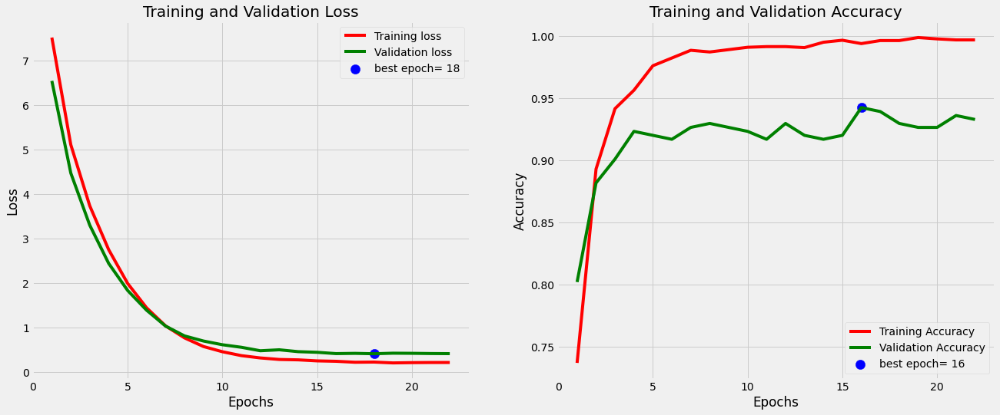

313/313 [==============================] - 23s 72ms/step - loss: 0.3460 - accuracy: 0.9425
accuracy on the test set is 94.25 %


In [272]:
working_dir=r'./'
tr_plot(history,0)
subject='boats'
acc=model.evaluate( test_gen, verbose=1, steps=test_steps, return_dict=False)[1]*100
msg=f'accuracy on the test set is {acc:5.2f} %'
print(msg)
generator=train_gen
scale = 1

In [273]:
def saver(save_path, model, model_name, subject, accuracy,img_size, scalar, generator):
    # first save the model
    save_id=str (model_name +  '-' + subject +'-'+ str(acc)[:str(acc).rfind('.')+3] + '.h5')
    model_save_loc=os.path.join(save_path, save_id)
    model.save(model_save_loc)
    print('model was saved as ') 
    # now create the class_df and convert to csv file    
    class_dict=generator.class_indices 
    height=[]
    width=[]
    scale=[]
    for i in range(len(class_dict)):
        height.append(img_size[0])
        width.append(img_size[1])
        scale.append(scalar)
    Index_series=pd.Series(list(class_dict.values()), name='class_index')
    Class_series=pd.Series(list(class_dict.keys()), name='class') 
    Height_series=pd.Series(height, name='height')
    Width_series=pd.Series(width, name='width')
    Scale_series=pd.Series(scale, name='scale by')
    class_df=pd.concat([Index_series, Class_series, Height_series, Width_series, Scale_series], axis=1)    
    csv_name='class_dict.csv'
    csv_save_loc=os.path.join(save_path, csv_name)
    class_df.to_csv(csv_save_loc, index=False) 
    print('class csv file was saved as ' + csv_save_loc)
    return model_save_loc, csv_save_loc

In [274]:
model_save_loc, csv_save_loc=saver(working_dir, model, model_name, subject, acc, img_size, scale,  generator)

model was saved as 
class csv file was saved as ./class_dict.csv


In [275]:
def print_info( test_gen, preds, print_code, save_dir, subject ):
    class_dict=test_gen.class_indices
    labels= test_gen.labels
    file_names= test_gen.filenames 
    error_list=[]
    true_class=[]
    pred_class=[]
    prob_list=[]
    new_dict={}
    error_indices=[]
    y_pred=[]
    for key,value in class_dict.items():
        new_dict[value]=key             # dictionary {integer of class number: string of class name}
    # store new_dict as a text fine in the save_dir
    classes=list(new_dict.values())     # list of string of class names     
    errors=0      
    for i, p in enumerate(preds):
        pred_index=np.argmax(p)         
        true_index=labels[i]  # labels are integer values
        if pred_index != true_index: # a misclassification has occurred
            error_list.append(file_names[i])
            true_class.append(new_dict[true_index])
            pred_class.append(new_dict[pred_index])
            prob_list.append(p[pred_index])
            error_indices.append(true_index)            
            errors=errors + 1
        y_pred.append(pred_index)    
    if errors>0:
        plot_bar=[]
        plot_class=[]
        for  key, value in new_dict.items():        
            count=error_indices.count(key) 
            if count!=0:
                plot_bar.append(count) # list containg how many times a class c had an error
                plot_class.append(value)   # stores the class 
        fig=plt.figure()
        fig.set_figheight(len(plot_class)/3)
        fig.set_figwidth(10)
        plt.style.use('fivethirtyeight')
    y_true= np.array(labels)        
    y_pred=np.array(y_pred)
    if len(classes)<= 30:
        # create a confusion matrix 
        cm = confusion_matrix(y_true, y_pred )        
        length=len(classes)
        if length<8:
            fig_width=8
            fig_height=8
        else:
            fig_width= int(length * .5)
            fig_height= int(length * .5)
        plt.figure(figsize=(fig_width, fig_height))
        sns.heatmap(cm, annot=True, vmin=0, fmt='g', cmap='Blues', cbar=False)       
        plt.xticks(np.arange(length)+.5, classes, rotation= 90)
        plt.yticks(np.arange(length)+.5, classes, rotation=0)
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.title("Confusion Matrix")
        plt.show()
    clr = classification_report(y_true, y_pred, target_names=classes)
    print("Classification Report:\n----------------------\n", clr)

<Figure size 720x96 with 0 Axes>

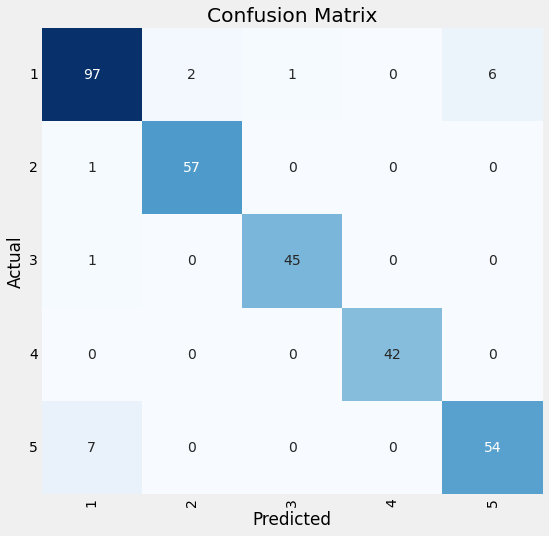

Classification Report:
----------------------
               precision    recall  f1-score   support

           1       0.92      0.92      0.92       106
           2       0.97      0.98      0.97        58
           3       0.98      0.98      0.98        46
           4       1.00      1.00      1.00        42
           5       0.90      0.89      0.89        61

    accuracy                           0.94       313
   macro avg       0.95      0.95      0.95       313
weighted avg       0.94      0.94      0.94       313



In [276]:
print_code=20 # set max value for number of mis-classified images files to print
preds=model.predict(test_gen) # make predictions on test set
print_info( test_gen, preds, print_code, working_dir, subject )  

In [277]:
testing_df=pd.read_csv(testpath)
length=len(testing_df)
submission_df=pd.DataFrame(columns=['image','category' ], index=range(length))
test_batch_size=sorted([int(length/n) for n in range(1,length+1) if length % n ==0 and length/n<=80],reverse=True)[0]  
test_steps=int(length/test_batch_size)
print ( 'test batch size: ' ,test_batch_size, '  test steps: ', test_steps)
testing_gen=tvgen.flow_from_dataframe( testing_df, sdir, x_col='image', y_col=None, target_size=img_size,
                                     color_mode='rgb', class_mode=None, shuffle=False, batch_size=test_batch_size)
predictions=model.predict(testing_gen, verbose=1,steps=test_steps )
files=testing_gen.filenames
class_dict=test_gen.class_indices
new_dict={}
for key, value in class_dict.items():
    new_dict[value]=key
for i, p in enumerate(predictions):
    index=np.argmax(p)
    klass=new_dict[index]
    submission_df['category'].iloc[i] =klass
    submission_df['image'].iloc[i]= files[i]    
csv_path=os.path.join(working_dir, 'submit.csv')
submission_csv=submission_df.to_csv(csv_path, index=False)
# check if the csv file is correct
submission_test_df=pd.read_csv(csv_path)
print (submission_test_df.head())

test batch size:  67   test steps:  40
Found 2680 validated image filenames.
40/40 [==============================] - 139s 3s/step
         image  category
0  1007700.jpg         4
1  1011369.jpg         4
2  1051155.jpg         4
3  1062001.jpg         2
4  1069397.jpg         4
